<a href="https://colab.research.google.com/github/BasithMedia/Marine-Object-Detection-Based-on-YOLO-V8/blob/main/Master_Project_V1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Environment Set Up & Library**

In [ ]:
%pip install opencv-python-headless scipy pandas numpy pyyaml ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 3.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Setup complete ✅ (12 CPUs, 83.5 GB RAM, 33.6/201.2 GB disk)


In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Import necessary libraries
import os
import shutil
import pandas as pd
import numpy as np
import cv2
from ultralytics import YOLO
from sklearn.model_selection import train_test_split
import yaml
import torch
import xml.etree.ElementTree as ET
from scipy import io
import matplotlib.pyplot as plt
import re
from tqdm import tqdm
import scipy.io as io
import logging
from scipy.io import loadmat
from concurrent.futures import ProcessPoolExecutor, as_completed
from tqdm.auto import tqdm
from IPython.display import Image
from collections import Counter

# **Data loading and preprocessing**

In [ ]:
#DO NOT RUN
# Set up logging
logging.basicConfig(filename='data_preprocessing.log', level=logging.INFO,
                    format='%(asctime)s - %(levelname)s - %(message)s')

def is_valid_bbox(bbox, image_width, image_height):
    if bbox is None or len(bbox) != 4:
        return False
    x, y, w, h = bbox
    # Check if width and height are positive
    if w <= 0 or h <= 0:
        return False
    # Check if the bounding box is at least partially within the image
    if x >= image_width or y >= image_height or x + w <= 0 or y + h <= 0:
        return False
    return True

def clip_bbox(bbox, image_width, image_height):
    x, y, w, h = bbox
    x = max(0, min(x, image_width - 1))
    y = max(0, min(y, image_height - 1))
    w = min(w, image_width - x)
    h = min(h, image_height - y)
    return [x, y, w, h]

def parse_mat_data(mat_data):

    frame_data = {}
    struct_xml = mat_data['structXML'][0]
    for i, item in enumerate(struct_xml):
        frame_number = i  # Use index as frame number
        objects = []
        num_objs = len(item['Object'])

        if num_objs > 0:  # Check if there are any objects in this frame
            for j in range(num_objs):  # Iterate over each object
              obj_data = {
                  'type': item['ObjectType'][j][0][0] if len(item['ObjectType']) > j and len(item['ObjectType'][j]) > 0 and len(item['ObjectType'][j][0]) > 0 else 'Unknown',
                  'id': j,
                  'bbox': item['BB'][j] if len(item['BB']) > j else None
              }
              objects.append(obj_data)
        frame_data[frame_number] = objects
    return frame_data

def process_mat_and_video(mat_path, video_path, output_dir, split):

      # Load .mat file
      mat_contents = io.loadmat(mat_path)

      # Parse mat data
      frame_data = parse_mat_data(mat_contents)

      # Open the video file
      video = cv2.VideoCapture(video_path)

      if not video.isOpened():
          raise Exception(f"Could not open video file: {video_path}")

      # Get video properties
      width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
      height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
      total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

      base_name = os.path.splitext(os.path.basename(mat_path))[0].replace('_ObjectGT', '')

      try:
        invalid_bbox_count = 0
        unknown_type_count = 0

        # Process each frame
        for frame_number in tqdm(frame_data.keys(), total=len(frame_data), desc=f"Processing {base_name}"):
            # Read the frame
            video.set(cv2.CAP_PROP_POS_FRAMES, frame_number)
            ret, frame = video.read()

            if not ret:
                logging.warning(f"Could not read frame {frame_number} from {video_path}")
                continue

            # Destination paths
            dest_img_path = os.path.join(output_dir, 'images', split, f"{base_name}_{frame_number:04d}.jpg")
            dest_label_path = os.path.join(output_dir, 'labels', split, f"{base_name}_{frame_number:04d}.txt")

            # Ensure directories exist
            os.makedirs(os.path.dirname(dest_img_path), exist_ok=True)
            os.makedirs(os.path.dirname(dest_label_path), exist_ok=True)

            # Save the frame as an image
            cv2.imwrite(dest_img_path, frame)

            # Create YOLO format annotations
            with open(dest_label_path, 'w') as f:
                for obj in frame_data[frame_number]:
                    obj_type = obj['type']
                    class_id = get_class_id(obj_type)
                    if class_id == -1:
                        logging.warning(f"Unknown object type '{obj_type}' in {base_name}, frame {frame_number}")
                        unknown_type_count += 1
                        continue

                    bbox = obj['bbox']
                    if not is_valid_bbox(bbox, width, height):
                        logging.warning(f"Invalid bounding box {bbox} in {base_name}, frame {frame_number}")
                        invalid_bbox_count += 1
                        continue

                    bbox = clip_bbox(bbox, width, height)
                    x, y, w, h = bbox
                    # Convert to YOLO format (normalized center x, center y, width, height)
                    x_center = (x + w/2) / width
                    y_center = (y + h/2) / height
                    width_norm = w / width
                    height_norm = h / height
                    f.write(f"{class_id} {x_center} {y_center} {width_norm} {height_norm}\n")

        video.release()
        return base_name, len(frame_data), invalid_bbox_count, unknown_type_count

      except Exception as e:
          logging.error(f"Error processing {mat_path}: {str(e)}")
          raise
          return base_name, 0, 0, 0

def process_folders(object_gt_paths, videos_paths, output_dir, train_videos, test_videos):
    total_frames = 0
    total_invalid_bboxes = 0
    total_unknown_types = 0
    processed_files = 0

    with ProcessPoolExecutor() as executor:
        futures = []
        for object_gt_path, videos_path in zip(object_gt_paths, videos_paths):
            for mat_file in os.listdir(object_gt_path):
                if mat_file.endswith('_ObjectGT.mat'):
                    mat_path = os.path.join(object_gt_path, mat_file)

                    # Determine if this file is in train or test set
                    video_name = mat_file.split('_')[0] + '_' + mat_file.split('_')[1]
                    if video_name in train_videos:
                        split = 'train'
                    elif video_name in test_videos:
                        split = 'test'
                    else:
                        print(f"Skipping {mat_file}: Not in train or test set")
                        continue

                    # Generate possible video names
                    base_name = mat_file.replace('_ObjectGT.mat', '')
                    possible_video_names = [
                        f"{base_name}.avi",
                        f"{base_name}_VIS.avi",
                        f"{base_name}_OB.avi",
                        f"{base_name}_VIS_OB.avi"
                    ]

                    # Try to find a matching video file
                    video_path = None
                    for video_name in possible_video_names:
                        temp_path = os.path.join(videos_path, video_name)
                        if os.path.exists(temp_path):
                            video_path = temp_path
                            break

                    if video_path:
                        futures.append(executor.submit(process_mat_and_video, mat_path, video_path, output_dir, split))
                    else:
                        logging.warning(f"Video file not found for {mat_file}")

        for future in tqdm(as_completed(futures), total=len(futures), desc="Overall Progress"):
            base_name, frames, invalid_bboxes, unknown_types = future.result()
            total_frames += frames
            total_invalid_bboxes += invalid_bboxes
            total_unknown_types += unknown_types
            processed_files += 1
            logging.info(f"Processed {base_name}: {frames} frames, {invalid_bboxes} invalid bboxes, {unknown_types} unknown types")

    return processed_files, total_frames, total_invalid_bboxes, total_unknown_types

#  class mapping
class_mapping = {
    'Buoy': 0,
    'Ferry': 1,
    'Vessel/ship': 2,
    'Sailboat/boat': 3,
    'NO Object': 4
}


def get_class_id(obj_type):
    return class_mapping.get(obj_type, -1)  # Return -1 for unknown types

# Define train and test splits
train_videos = [
    'MVI_1451', 'MVI_1452', 'MVI_1470', 'MVI_1471', 'MVI_1478', 'MVI_1479',
    'MVI_1481', 'MVI_1482', 'MVI_1483', 'MVI_1484', 'MVI_1485', 'MVI_1486',
    'MVI_1578', 'MVI_1582', 'MVI_1583', 'MVI_1584', 'MVI_1609', 'MVI_1610',
    'MVI_1619', 'MVI_1612', 'MVI_1617', 'MVI_1620', 'MVI_1622', 'MVI_1623',
    'MVI_1624', 'MVI_1625', 'MVI_1626', 'MVI_1627', 'MVI_0788', 'MVI_0789',
    'MVI_0790', 'MVI_0792', 'MVI_0794', 'MVI_0795', 'MVI_0796', 'MVI_0797',
    'MVI_0801'
]

test_videos = [
    'MVI_1469', 'MVI_1474', 'MVI_1587', 'MVI_1592', 'MVI_1613', 'MVI_1614',
    'MVI_1615', 'MVI_1644', 'MVI_1645', 'MVI_1646', 'MVI_1448', 'MVI_1640',
    'MVI_0799', 'MVI_0804'
]

# Main execution
if __name__ == "__main__":
    base_dir = '/content/drive/MyDrive/Master Project/smd_plus'  # Replace with your actual base directory
    output_dir = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12'  # Replace with your desired output directory

    object_gt_paths = [
        os.path.join(base_dir, 'VIS_Onboard', 'ObjectGT'),
        os.path.join(base_dir, 'VIS_Onshore', 'ObjectGT')
    ]
    videos_paths = [
        os.path.join(base_dir, 'VIS_Onboard', 'Videos'),
        os.path.join(base_dir, 'VIS_Onshore', 'Videos')
    ]

    # Process both folders
    print("Processing VIS_Onboard and VIS_Onshore folders:")
    processed_files, total_frames, total_invalid_bboxes, total_unknown_types = process_folders(
        object_gt_paths, videos_paths, output_dir, train_videos, test_videos
    )

    print("\nData preprocessing and setup complete!")
    print(f"Processed {processed_files} files")
    print(f"Total frames: {total_frames}")
    print(f"Total invalid bounding boxes: {total_invalid_bboxes}")
    print(f"Total unknown object types: {total_unknown_types}")

    logging.info("Data preprocessing completed successfully")
    logging.info(f"Processed {processed_files} files")
    logging.info(f"Total frames: {total_frames}")
    logging.info(f"Total invalid bounding boxes: {total_invalid_bboxes}")
    logging.info(f"Total unknown object types: {total_unknown_types}")

Processing VIS_Onboard and VIS_Onshore folders:


Overall Progress:   0%|          | 0/51 [00:00<?, ?it/s]

Processing MVI_0792_VIS:   0%|          | 0/299 [00:00<?, ?it/s]

Processing MVI_0799_VIS:   0%|          | 0/600 [00:00<?, ?it/s]

Processing MVI_0790_VIS:   0%|          | 0/600 [00:00<?, ?it/s]

Processing MVI_0797_VIS:   0%|          | 0/600 [00:00<?, ?it/s]

Processing MVI_0804_VIS:   0%|          | 0/299 [00:00<?, ?it/s]

Processing MVI_0796_VIS:   0%|          | 0/299 [00:00<?, ?it/s]

Processing MVI_0795_VIS:   0%|          | 0/255 [00:00<?, ?it/s]

Processing MVI_0794_VIS:   0%|          | 0/291 [00:00<?, ?it/s]

Processing MVI_1470_VIS:   0%|          | 0/266 [00:00<?, ?it/s]

Processing MVI_1448_VIS_Haze:   0%|          | 0/604 [00:00<?, ?it/s]

Processing MVI_1469_VIS:   0%|          | 0/600 [00:00<?, ?it/s]

Processing MVI_1452_VIS_Haze:   0%|          | 0/340 [00:00<?, ?it/s]

Processing MVI_1451_VIS_Haze:   0%|          | 0/439 [00:00<?, ?it/s]

Processing MVI_1583_VIS:   0%|          | 0/251 [00:00<?, ?it/s]

Processing MVI_1486_VIS:   0%|          | 0/629 [00:00<?, ?it/s]

Processing MVI_1481_VIS:   0%|          | 0/409 [00:00<?, ?it/s]

Processing MVI_1483_VIS:   0%|          | 0/299 [00:00<?, ?it/s]

Processing MVI_1582_VIS:   0%|          | 0/540 [00:00<?, ?it/s]

Processing MVI_1478_VIS:   0%|          | 0/477 [00:00<?, ?it/s]

Processing MVI_1471_VIS:   0%|          | 0/299 [00:00<?, ?it/s]

Processing MVI_1479_VIS:   0%|          | 0/206 [00:00<?, ?it/s]

Processing MVI_1587_VIS:   0%|          | 0/600 [00:00<?, ?it/s]

Processing MVI_1578_VIS:   0%|          | 0/505 [00:00<?, ?it/s]

Processing MVI_1485_VIS:   0%|          | 0/104 [00:00<?, ?it/s]

Processing MVI_1584_VIS:   0%|          | 0/539 [00:00<?, ?it/s]

Processing MVI_1482_VIS:   0%|          | 0/454 [00:00<?, ?it/s]

Processing MVI_1484_VIS:   0%|          | 0/687 [00:00<?, ?it/s]

Processing MVI_1474_VIS:   0%|          | 0/445 [00:00<?, ?it/s]

Processing MVI_1624_VIS:   0%|          | 0/494 [00:00<?, ?it/s]

Processing MVI_1613_VIS:   0%|          | 0/626 [00:00<?, ?it/s]

Processing MVI_1620_VIS:   0%|          | 0/502 [00:00<?, ?it/s]

Processing MVI_1619_VIS:   0%|          | 0/473 [00:00<?, ?it/s]

Processing MVI_1622_VIS:   0%|          | 0/309 [00:00<?, ?it/s]

Processing MVI_1615_VIS:   0%|          | 0/566 [00:00<?, ?it/s]

Processing MVI_1592_VIS:   0%|          | 0/491 [00:00<?, ?it/s]

Processing MVI_1610_VIS:   0%|          | 0/543 [00:00<?, ?it/s]

Processing MVI_1609_VIS:   0%|          | 0/505 [00:00<?, ?it/s]

Processing MVI_1617_VIS:   0%|          | 0/600 [00:00<?, ?it/s]

Processing MVI_1614_VIS:   0%|          | 0/582 [00:00<?, ?it/s]

Processing MVI_1623_VIS:   0%|          | 0/522 [00:00<?, ?it/s]

Processing MVI_1625_VIS:   0%|          | 0/995 [00:00<?, ?it/s]

Processing MVI_1612_VIS:   0%|          | 0/261 [00:00<?, ?it/s]

Processing MVI_1644_VIS:   0%|          | 0/252 [00:00<?, ?it/s]

Processing MVI_1645_VIS:   0%|          | 0/535 [00:00<?, ?it/s]

Processing MVI_1626_VIS:   0%|          | 0/556 [00:00<?, ?it/s]

Processing MVI_1640_VIS:   0%|          | 0/310 [00:00<?, ?it/s]

Processing MVI_1646_VIS:   0%|          | 0/520 [00:00<?, ?it/s]

Processing MVI_1627_VIS:   0%|          | 0/600 [00:00<?, ?it/s]


Data preprocessing and setup complete!
Processed 51 files
Total frames: 23356
Total invalid bounding boxes: 0
Total unknown object types: 27615


In [ ]:
base_dir = '/content/drive/MyDrive/Master Project/smd_plus'
output_dir = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12'

In [ ]:
# Verify the processed data
for split in ['train', 'test']:
    n_images = len(os.listdir(os.path.join(output_dir, 'images', split)))
    n_labels = len(os.listdir(os.path.join(output_dir, 'labels', split)))
    print(f"{split} set: {n_images} images, {n_labels} label files")

import yaml

with open('/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/data.yaml', 'r') as file:
    data_config = yaml.safe_load(file)

print(data_config)

train set: 16326 images, 16326 label files
test set: 7030 images, 7030 label files
{'names': ['Buoy', 'Ferry', 'Vessel/ship', 'Sailboat/boat', 'NO Object'], 'nc': 5, 'path': '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12', 'test': '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/images/test', 'train': '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/images/train', 'val': '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/images/test', 'weights': [0.02725503435675418, 0.24468692055341607, 0.7471689895470384, 1.0, 0.938200710965272]}


In [ ]:
#DO NOT RUN
def count_zero_byte_files(paths):
    total_count = 0

    for path in paths:
        for root, dirs, files in os.walk(path):
            for file in files:
                if file.endswith('.txt'):
                    file_path = os.path.join(root, file)
                    if os.path.getsize(file_path) == 0:
                        total_count += 1

    return total_count

# Paths to scan
paths = [
    "/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/test",
    "/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/train"
]

# Count zero-byte files
zero_byte_count = count_zero_byte_files(paths)

print(f"Total number of .txt files with 0 bytes size: {zero_byte_count}")

Total number of .txt files with 0 bytes size: 0


In [ ]:
#DO NOT RUN
def process_zero_byte_files(paths):
    total_count = 0
    updated_count = 0

    for path in paths:
        for root, dirs, files in os.walk(path):
            for file in files:
                if file.endswith('.txt'):
                    file_path = os.path.join(root, file)
                    if os.path.getsize(file_path) == 0:
                        total_count += 1
                        try:
                            with open(file_path, 'w') as f:
                                f.write("4 0 0 0 0")
                            updated_count += 1
                        except IOError as e:
                            print(f"Error writing to file {file_path}: {e}")

    return total_count, updated_count

# Paths to scan and update
paths = [
    "/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/test",
    "/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/train"
]

# Process zero-byte files
total_zero_byte_files, updated_files = process_zero_byte_files(paths)

print(f"Total number of .txt files with 0 bytes size: {total_zero_byte_files}")
print(f"Number of files successfully updated: {updated_files}")

Total number of .txt files with 0 bytes size: 794
Number of files successfully updated: 794


In [ ]:
#DO NOT RUN
# Path to your data.yaml file
yaml_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/data.yaml'

# New data to be written
new_data = {
    'path': '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12',
    'train': '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/images/train',
    'val': '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/images/test',
    'test': '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/images/test',
    'nc': 5,
    'names': ['Buoy', 'Ferry', 'Vessel/ship', 'Sailboat/boat', 'NO Object']
}

# Write the new data to the YAML file
with open(yaml_path, 'w') as file:
    yaml.dump(new_data, file, default_flow_style=False)

print(f"Updated {yaml_path} with new data.")

# Verify the contents of the updated file
with open(yaml_path, 'r') as file:
    updated_data = yaml.safe_load(file)
    print("\nUpdated YAML contents:")
    print(yaml.dump(updated_data, default_flow_style=False))

Updated /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/data.yaml with new data.

Updated YAML contents:
names:
- Buoy
- Ferry
- Vessel/ship
- Sailboat/boat
- NO Object
nc: 5
path: /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12
test: /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/images/test
train: /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/images/train
val: /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/images/test



# **Training**

# **1st training attempt with YoloV8n Model**

In [ ]:
#DO NOT RUN
# Set the paths
dataset_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12'
yaml_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/data.yaml'
output_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results'

# Create the output directory if it doesn't exist
os.makedirs(output_path, exist_ok=True)


# Function to generate a unique run name
def get_run_name(base_path):
    i = 1
    while True:
        run_name = f'run_{i}'
        if not os.path.exists(os.path.join(base_path, run_name)):
            return run_name
        i += 1


try:
    # Initialize the YOLO model
    model = YOLO('yolov8n.pt')

    # Generate a unique run name
    run_name = get_run_name(output_path)

    # Train the model
    results = model.train(
        data=yaml_path,
        epochs=50,
        imgsz=640,
        batch=8,
        device=0 if torch.cuda.is_available() else 'cpu',
        workers=4,
        cache=False,
        patience=15,
        save_period=2,
        project=output_path,
        name=run_name
    )

    # Save the trained model
    model.save(f'{output_path}/{run_name}/weights/best.pt')

    print(f"Training complete. Model saved to {output_path}/{run_name}/weights/best.pt")

    # Validate the model
    val_results = model.val(data=yaml_path, project=output_path, name=f'{run_name}_val')
    print("Validation results:", val_results)

except Exception as e:
    print(f"An error occurred: {str(e)}")

    # Print CUDA memory usage
    if torch.cuda.is_available():
        print(f"CUDA memory allocated: {torch.cuda.memory_allocated(0)}")
        print(f"CUDA memory reserved: {torch.cuda.memory_reserved(0)}")

100%|██████████| 6.25M/6.25M [00:00<00:00, 112MB/s]


Ultralytics YOLOv8.2.74 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/data.yaml, epochs=50, time=None, patience=15, batch=8, imgsz=640, save=True, save_period=2, cache=False, device=0, workers=4, project=/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results, name=run_3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_

100%|██████████| 755k/755k [00:00<00:00, 24.3MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/train.cache... 16326 images, 0 backgrounds, 0 corrupt: 100%|██████████| 16326/16326 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/test.cache... 7030 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7030/7030 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       1.3G      1.273      1.395      0.994         51        640: 100%|██████████| 2041/2041 [50:42<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [01:03<00:00,  6.93it/s]


                   all       7030      53769       0.59       0.38      0.415      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.24G      1.086      0.809     0.9342         58        640: 100%|██████████| 2041/2041 [02:57<00:00, 11.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:41<00:00, 10.59it/s]


                   all       7030      53769      0.503      0.415      0.365        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.26G      1.043     0.7007     0.9226         79        640: 100%|██████████| 2041/2041 [02:54<00:00, 11.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.84it/s]


                   all       7030      53769       0.73      0.363      0.366      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       1.2G     0.9807     0.6066     0.9121         97        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.92it/s]


                   all       7030      53769      0.768      0.389        0.4      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50       1.2G     0.9038     0.5322     0.8947         70        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.98it/s]


                   all       7030      53769       0.49      0.405       0.37      0.193

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.19G     0.8483     0.4907     0.8828        103        640: 100%|██████████| 2041/2041 [02:51<00:00, 11.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.95it/s]


                   all       7030      53769      0.813      0.366      0.445      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.19G     0.8097     0.4635     0.8755         97        640: 100%|██████████| 2041/2041 [02:52<00:00, 11.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.87it/s]


                   all       7030      53769      0.457      0.417      0.369      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.22G     0.7838     0.4448     0.8704         58        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.97it/s]


                   all       7030      53769      0.511      0.393      0.384      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.25G     0.7587     0.4297     0.8645         61        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:39<00:00, 11.02it/s]


                   all       7030      53769      0.504      0.331      0.362      0.187

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.18G     0.7387      0.417     0.8606         41        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.91it/s]


                   all       7030      53769      0.752      0.395      0.391      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.17G     0.7179     0.4046     0.8574         59        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.85it/s]

                   all       7030      53769       0.76      0.384      0.403      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.18G     0.7032      0.396     0.8545         43        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.93it/s]


                   all       7030      53769      0.779      0.389      0.402      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.18G     0.6885     0.3872     0.8502         44        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.86it/s]

                   all       7030      53769      0.751      0.374      0.394      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.18G     0.6752     0.3792     0.8484         65        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.85it/s]


                   all       7030      53769      0.766      0.415      0.393       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.18G     0.6655     0.3741     0.8468         81        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.81it/s]

                   all       7030      53769      0.827      0.386      0.452       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.18G     0.6561     0.3686     0.8451         59        640: 100%|██████████| 2041/2041 [02:55<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.98it/s]

                   all       7030      53769      0.845      0.356      0.416      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.18G       0.65     0.3642      0.844         57        640: 100%|██████████| 2041/2041 [02:52<00:00, 11.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.95it/s]

                   all       7030      53769      0.694      0.371      0.385      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.22G     0.6364     0.3575     0.8412         91        640: 100%|██████████| 2041/2041 [02:52<00:00, 11.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.91it/s]

                   all       7030      53769      0.778      0.341       0.38      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.18G     0.6299     0.3539     0.8391         93        640: 100%|██████████| 2041/2041 [02:52<00:00, 11.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.95it/s]

                   all       7030      53769      0.769      0.372      0.416      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.26G      0.625       0.35     0.8386         81        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:39<00:00, 11.00it/s]


                   all       7030      53769      0.778       0.36      0.411      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.17G     0.6137     0.3454      0.836         65        640: 100%|██████████| 2041/2041 [02:54<00:00, 11.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.89it/s]

                   all       7030      53769      0.567      0.363      0.399      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.17G     0.6077     0.3411      0.835         32        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.88it/s]

                   all       7030      53769      0.805      0.401      0.445      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.17G     0.6025     0.3383     0.8344         88        640: 100%|██████████| 2041/2041 [02:54<00:00, 11.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.98it/s]

                   all       7030      53769      0.571      0.374      0.389      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.22G     0.5971     0.3347     0.8344         50        640: 100%|██████████| 2041/2041 [02:54<00:00, 11.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.88it/s]

                   all       7030      53769      0.594      0.395      0.398      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.22G     0.5907     0.3321     0.8321         63        640: 100%|██████████| 2041/2041 [02:54<00:00, 11.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.91it/s]

                   all       7030      53769      0.524      0.363      0.372      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.18G     0.5849     0.3285     0.8313         47        640: 100%|██████████| 2041/2041 [02:54<00:00, 11.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.92it/s]

                   all       7030      53769      0.794      0.329      0.392      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.18G     0.5762     0.3242     0.8306         30        640: 100%|██████████| 2041/2041 [02:54<00:00, 11.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.79it/s]


                   all       7030      53769      0.746      0.348      0.375      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.17G     0.5712     0.3215      0.828         61        640: 100%|██████████| 2041/2041 [02:54<00:00, 11.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.89it/s]

                   all       7030      53769      0.735      0.333      0.362      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.17G     0.5673     0.3182     0.8282         48        640: 100%|██████████| 2041/2041 [02:53<00:00, 11.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.94it/s]


                   all       7030      53769      0.518       0.39      0.375      0.204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.17G     0.5613     0.3155     0.8277         76        640: 100%|██████████| 2041/2041 [02:54<00:00, 11.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:40<00:00, 10.85it/s]


                   all       7030      53769      0.523      0.379      0.373      0.203
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 15, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

30 epochs completed in 2.596 hours.
Optimizer stripped from /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt...
Ultralytics YOLOv8.2.74 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFL

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:49<00:00,  8.92it/s]


                   all       7030      53769      0.816      0.393      0.452      0.249
                  Buoy        628        628      0.501      0.516       0.52      0.296
                 Ferry       1045       1935      0.999       0.31      0.435      0.261
           Vessel/ship       6758      45722      0.877      0.763      0.862      0.484
         Sailboat/boat       2831       4603      0.703      0.374      0.442      0.207
             NO Object        689        881          1          0          0          0
Speed: 0.1ms preprocess, 0.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3
Training complete. Model saved to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt
Ultralytics YOLOv8.2.74 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused)

val: Scanning /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/test.cache... 7030 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7030/7030 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 879/879 [02:01<00:00,  7.24it/s]


                   all       7030      53769      0.828      0.387      0.453       0.25
                  Buoy        628        628      0.526      0.506      0.522      0.298
                 Ferry       1045       1935      0.999       0.31      0.435      0.261
           Vessel/ship       6758      45722      0.884      0.756      0.863      0.484
         Sailboat/boat       2831       4603      0.731      0.361      0.445      0.207
             NO Object        689        881          1          0          0          0
Speed: 0.1ms preprocess, 1.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3_val
Validation results: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c85fc433a60>
curves: ['Pr

# **2nd training attempt with YoloV8m Model**

In [ ]:
#DO NOT RUN
# Set the paths
dataset_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12'
yaml_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/data.yaml'
output_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results'

# Create the output directory if it doesn't exist
os.makedirs(output_path, exist_ok=True)

# Function to generate a unique run name
def get_run_name(base_path):
    i = 1
    while True:
        run_name = f'run_{i}'
        if not os.path.exists(os.path.join(base_path, run_name)):
            return run_name
        i += 1

try:
    # Initialize the YOLO model
    model = YOLO('yolov8m.pt')

    # Generate a unique run name
    run_name = get_run_name(output_path)

    # Train the model
    results = model.train(
        data=yaml_path,
        epochs=50,
        imgsz=640,
        batch=8,
        device=0 if torch.cuda.is_available() else 'cpu',
        workers=4,
        cache=False,
        patience=15,
        save_period=2,
        project=output_path,
        name=run_name
    )

    # Save the trained model
    model.save(f'{output_path}/{run_name}/weights/best.pt')

    print(f"Training complete. Model saved to {output_path}/{run_name}/weights/best.pt")

    # Validate the model
    val_results = model.val(data=yaml_path, project=output_path, name=f'{run_name}_val')
    print("Validation results:", val_results)

except Exception as e:
    print(f"An error occurred: {str(e)}")

    # Print CUDA memory usage
    if torch.cuda.is_available():
        print(f"CUDA memory allocated: {torch.cuda.memory_allocated(0)}")
        print(f"CUDA memory reserved: {torch.cuda.memory_reserved(0)}")

100%|██████████| 49.7M/49.7M [00:00<00:00, 306MB/s]


Ultralytics YOLOv8.2.74 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/data.yaml, epochs=50, time=None, patience=15, batch=8, imgsz=640, save=True, save_period=2, cache=False, device=0, workers=4, project=/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results, name=run_4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_

train: Scanning /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/train.cache... 16326 images, 0 backgrounds, 0 corrupt: 100%|██████████| 16326/16326 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/test.cache... 7030 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7030/7030 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       4.1G      1.059     0.7307     0.9518         51        640: 100%|██████████| 2041/2041 [03:56<00:00,  8.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:43<00:00, 10.20it/s]


                   all       7030      53769      0.782      0.423      0.482      0.275

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.92G     0.8873     0.4803     0.8916         58        640: 100%|██████████| 2041/2041 [03:37<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.27it/s]


                   all       7030      53769      0.482      0.446       0.46      0.252

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.02G     0.8711     0.4755     0.8903         79        640: 100%|██████████| 2041/2041 [03:33<00:00,  9.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.36it/s]


                   all       7030      53769      0.503      0.394      0.425      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.98G     0.8348      0.454     0.8884         97        640: 100%|██████████| 2041/2041 [03:32<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.38it/s]


                   all       7030      53769      0.704      0.323      0.406      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         4G     0.7641     0.4142     0.8731         70        640: 100%|██████████| 2041/2041 [03:31<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.38it/s]


                   all       7030      53769      0.583      0.407      0.486      0.264

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         4G     0.7148     0.3859     0.8612        103        640: 100%|██████████| 2041/2041 [03:31<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.34it/s]

                   all       7030      53769      0.613      0.425       0.46      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         4G     0.6798     0.3664     0.8556         97        640: 100%|██████████| 2041/2041 [03:31<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.32it/s]


                   all       7030      53769      0.788      0.414      0.501      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.02G     0.6556     0.3526     0.8511         58        640: 100%|██████████| 2041/2041 [03:32<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.41it/s]

                   all       7030      53769      0.524      0.421      0.434      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.97G      0.634     0.3424     0.8454         61        640: 100%|██████████| 2041/2041 [03:32<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.38it/s]

                   all       7030      53769      0.856      0.368      0.506      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.91G     0.6126     0.3305     0.8412         41        640: 100%|██████████| 2041/2041 [03:32<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.38it/s]


                   all       7030      53769      0.592      0.455      0.492      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.97G     0.5959     0.3211      0.839         59        640: 100%|██████████| 2041/2041 [03:32<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.34it/s]

                   all       7030      53769      0.638      0.454      0.552      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.01G     0.5823      0.315     0.8373         43        640: 100%|██████████| 2041/2041 [03:33<00:00,  9.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.32it/s]


                   all       7030      53769       0.56      0.393       0.47      0.241

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.96G     0.5689     0.3077     0.8335         44        640: 100%|██████████| 2041/2041 [03:32<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.32it/s]

                   all       7030      53769      0.474      0.414      0.438      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.98G     0.5569      0.301     0.8312         65        640: 100%|██████████| 2041/2041 [03:33<00:00,  9.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.41it/s]


                   all       7030      53769      0.784      0.437      0.472      0.275

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         4G     0.5473     0.2961     0.8303         81        640: 100%|██████████| 2041/2041 [03:33<00:00,  9.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.36it/s]

                   all       7030      53769      0.759      0.462      0.527      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         4G     0.5376     0.2907     0.8286         59        640: 100%|██████████| 2041/2041 [03:34<00:00,  9.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:43<00:00, 10.07it/s]


                   all       7030      53769       0.68       0.41      0.417      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.98G     0.5327     0.2865     0.8278         57        640: 100%|██████████| 2041/2041 [03:33<00:00,  9.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.33it/s]


                   all       7030      53769      0.543      0.397      0.448      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.94G     0.5239      0.282     0.8255         91        640: 100%|██████████| 2041/2041 [03:32<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.44it/s]


                   all       7030      53769      0.479      0.409      0.438      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.99G     0.5142      0.279      0.824         93        640: 100%|██████████| 2041/2041 [03:31<00:00,  9.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.43it/s]

                   all       7030      53769      0.572      0.408      0.465      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.01G     0.5069     0.2738     0.8228         81        640: 100%|██████████| 2041/2041 [03:31<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.24it/s]


                   all       7030      53769      0.765      0.406      0.466      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.98G     0.4983     0.2691     0.8208         65        640: 100%|██████████| 2041/2041 [03:31<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.36it/s]

                   all       7030      53769      0.735      0.411      0.444      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.98G     0.4924     0.2658     0.8198         32        640: 100%|██████████| 2041/2041 [03:31<00:00,  9.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.34it/s]

                   all       7030      53769      0.727      0.417      0.441      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.98G     0.4866     0.2634     0.8189         88        640: 100%|██████████| 2041/2041 [03:31<00:00,  9.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:41<00:00, 10.48it/s]


                   all       7030      53769      0.783      0.425      0.482      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.02G     0.4789     0.2596     0.8186         50        640: 100%|██████████| 2041/2041 [03:33<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.32it/s]


                   all       7030      53769      0.795      0.376      0.485      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.03G      0.472     0.2558     0.8162         63        640: 100%|██████████| 2041/2041 [03:34<00:00,  9.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.36it/s]


                   all       7030      53769      0.754      0.377      0.426       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       3.9G     0.4657     0.2524     0.8151         47        640: 100%|██████████| 2041/2041 [03:34<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:42<00:00, 10.25it/s]


                   all       7030      53769      0.757      0.433      0.457      0.261
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 11, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

26 epochs completed in 1.861 hours.
Optimizer stripped from /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/last.pt, 52.0MB
Optimizer stripped from /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt, 52.0MB

Validating /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt...
Ultralytics YOLOv8.2.74 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [00:52<00:00,  8.35it/s]


                   all       7030      53769      0.639      0.453      0.552      0.323
                  Buoy        628        628      0.554      0.571      0.524      0.302
                 Ferry       1045       1935      0.993      0.311      0.686      0.445
           Vessel/ship       6758      45722      0.843      0.804       0.88       0.54
         Sailboat/boat       2831       4603      0.805      0.581       0.67      0.328
             NO Object        689        881          0          0    0.00234    0.00107
Speed: 0.1ms preprocess, 1.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4
Training complete. Model saved to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt
Ultralytics YOLOv8.2.74 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused)

val: Scanning /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/test.cache... 7030 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7030/7030 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 879/879 [02:06<00:00,  6.94it/s]


                   all       7030      53769      0.639      0.453      0.553      0.324
                  Buoy        628        628      0.552      0.571      0.523      0.302
                 Ferry       1045       1935      0.993      0.311      0.688      0.445
           Vessel/ship       6758      45722      0.844      0.805      0.881      0.542
         Sailboat/boat       2831       4603      0.804       0.58      0.669      0.328
             NO Object        689        881          0          0    0.00234    0.00103
Speed: 0.1ms preprocess, 1.9ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4_val
Validation results: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c8638094d30>
curves: ['Pr

# **Checking the data Imbalance, 3rd Training with Data Augmentation YoloV8m**

---



In [ ]:
#Do Not Run
def count_classes(dataset_path, yaml_path):
    # Load class names from YAML file
    with open(yaml_path, 'r') as file:
        yaml_data = yaml.safe_load(file)
        class_names = yaml_data['names']

    class_counts = Counter()
    labels_path = os.path.join(dataset_path, 'labels')

    for split in ['train', 'test']:
        split_path = os.path.join(labels_path, split)
        if not os.path.exists(split_path):
            print(f"Warning: {split_path} does not exist.")
            continue
        for filename in tqdm(os.listdir(split_path), desc=f"Processing {split}"):
            if filename.endswith('.txt'):
                with open(os.path.join(split_path, filename), 'r') as f:
                    for line in f:
                        class_id = int(line.split()[0])
                        class_counts[class_id] += 1
    return class_counts, class_names

# Update these paths to match your setup
dataset_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12'
yaml_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/data.yaml'

class_counts, class_names = count_classes(dataset_path, yaml_path)

for class_id, count in class_counts.items():
    print(f"{class_names[class_id]}: {count}")

# Calculate imbalance ratios
max_count = max(class_counts.values())
for class_id, count in class_counts.items():
    imbalance_ratio = max_count / count
    print(f"Imbalance ratio for {class_names[class_id]}: {imbalance_ratio:.2f}")

Processing test: 100%|██████████| 7030/7030 [01:22<00:00, 85.68it/s] 

Vessel/ship: 125885
Sailboat/boat: 14022
NO Object: 4592
Buoy: 3431
Ferry: 3657
Imbalance ratio for Vessel/ship: 1.00
Imbalance ratio for Sailboat/boat: 8.98
Imbalance ratio for NO Object: 27.41
Imbalance ratio for Buoy: 36.69
Imbalance ratio for Ferry: 34.42


In [ ]:
#Do Not Run
def update_yaml_with_weights(yaml_path, class_counts):
    with open(yaml_path, 'r') as file:
        data = yaml.safe_load(file)

    total_count = sum(class_counts.values())
    weights = [total_count / (len(class_counts) * count) for count in class_counts.values()]

    # Normalize weights
    max_weight = max(weights)
    normalized_weights = [w / max_weight for w in weights]

    # Add or update the 'weights' field
    data['weights'] = normalized_weights

    with open(yaml_path, 'w') as file:
        yaml.dump(data, file)

# Example usage
yaml_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/data.yaml'
class_counts = {0: 125885, 1: 14022, 2: 4592, 3: 3431, 4: 3657}
update_yaml_with_weights(yaml_path, class_counts)

In [ ]:
#DO NOT RUN
# Set the paths
yaml_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/data.yaml'
output_path = '/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results'

# Create the output directory if it doesn't exist
os.makedirs(output_path, exist_ok=True)

# Function to generate a unique run name
def get_run_name(base_path):
    i = 1
    while True:
        run_name = f'run_{i}'
        if not os.path.exists(os.path.join(base_path, run_name)):
            return run_name
        i += 1

try:
    # Initialize the YOLO model
    model = YOLO('yolov8m.pt')  # Using medium model for complex class distribution

    # Generate a unique run name
    run_name = get_run_name(output_path)

    # Train the model with parameters adjusted for class imbalance
    results = model.train(
        data=yaml_path,
        epochs=50,  # Increased epochs for better learning of underrepresented classes
        imgsz=640,
        batch=16,
        device=0 if torch.cuda.is_available() else 'cpu',
        workers=4,
        patience=15,
        save_period=5,
        project=output_path,
        name=run_name,
        lr0=0.01,
        lrf=0.001,  # Lower final learning rate for fine-tuning
        momentum=0.937,
        weight_decay=0.0005,
        warmup_epochs=3.0,
        warmup_momentum=0.8,
        warmup_bias_lr=0.1,
        box=7.5,
        cls=0.3,  # Reduced classification loss weight
        dfl=1.5,
        hsv_h=0.015,
        hsv_s=0.7,
        hsv_v=0.4,
        degrees=10.0,
        translate=0.2,
        scale=0.5,
        shear=2.0,
        perspective=0.0,
        flipud=0.5,
        fliplr=0.5,
        mosaic=1.0,
        mixup=0.25,  # Increased mixup for better generalization
        copy_paste=0.3,  # Increased copy-paste for better generalization
        auto_augment='randaugment',  # Use RandAugment for more diverse augmentations
    )

    # Save the trained model
    model.save(f'{output_path}/{run_name}/weights/best.pt')

    print(f"Training complete. Model saved to {output_path}/{run_name}/weights/best.pt")

    # Validate the model
    val_results = model.val(data=yaml_path, project=output_path, name=f'{run_name}_val')
    print("Validation results:", val_results)

except Exception as e:
    print(f"An error occurred: {str(e)}")

    # Print CUDA memory usage
    if torch.cuda.is_available():
        print(f"CUDA memory allocated: {torch.cuda.memory_allocated(0)}")
        print(f"CUDA memory reserved: {torch.cuda.memory_reserved(0)}")

Ultralytics YOLOv8.2.74 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/data.yaml, epochs=50, time=None, patience=15, batch=16, imgsz=640, save=True, save_period=5, cache=False, device=0, workers=4, project=/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results, name=run_2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina

100%|██████████| 755k/755k [00:00<00:00, 14.2MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 71.6MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/train.cache... 16326 images, 0 backgrounds, 0 corrupt: 100%|██████████| 16326/16326 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/test.cache... 7030 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7030/7030 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       7.4G      1.338     0.6022      1.082        128        640: 100%|██████████| 1021/1021 [33:56<00:00,  1.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:38<00:00,  5.70it/s]


                   all       7030      53769      0.822      0.423      0.516      0.271

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      7.19G      1.101     0.3615     0.9772         55        640: 100%|██████████| 1021/1021 [03:03<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.88it/s]


                   all       7030      53769      0.901      0.414       0.53      0.285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.33G      1.078     0.3503     0.9684         50        640: 100%|██████████| 1021/1021 [03:01<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.89it/s]


                   all       7030      53769      0.557      0.351      0.411      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       7.3G      1.034     0.3366     0.9601         48        640: 100%|██████████| 1021/1021 [03:04<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.82it/s]


                   all       7030      53769      0.822      0.353      0.513      0.263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.31G     0.9496     0.3036     0.9365        119        640: 100%|██████████| 1021/1021 [03:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.84it/s]


                   all       7030      53769      0.535      0.392      0.457      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.42G     0.8893     0.2818     0.9207         72        640: 100%|██████████| 1021/1021 [03:02<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.88it/s]


                   all       7030      53769      0.695      0.456      0.455      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.31G     0.8485     0.2676     0.9093         66        640: 100%|██████████| 1021/1021 [03:03<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.87it/s]


                   all       7030      53769      0.602      0.403      0.478      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.31G      0.815     0.2573     0.9013         67        640: 100%|██████████| 1021/1021 [03:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.89it/s]


                   all       7030      53769       0.87      0.427      0.543      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50       7.3G     0.7866     0.2469      0.894         60        640: 100%|██████████| 1021/1021 [03:02<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.87it/s]


                   all       7030      53769      0.801      0.348      0.423      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.38G     0.7624     0.2395      0.888         60        640: 100%|██████████| 1021/1021 [03:03<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.93it/s]


                   all       7030      53769       0.53       0.47      0.482      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.28G     0.7425     0.2329     0.8817        106        640: 100%|██████████| 1021/1021 [03:03<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.80it/s]


                   all       7030      53769      0.565      0.472      0.478      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       7.2G     0.7227     0.2278      0.877         54        640: 100%|██████████| 1021/1021 [03:03<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.90it/s]


                   all       7030      53769      0.797      0.462      0.508      0.267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.31G     0.7075     0.2218     0.8747        121        640: 100%|██████████| 1021/1021 [03:02<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.92it/s]


                   all       7030      53769      0.808       0.46      0.511       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.35G     0.6934     0.2174     0.8706         90        640: 100%|██████████| 1021/1021 [03:04<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.92it/s]


                   all       7030      53769      0.733      0.383      0.426      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       7.3G      0.681     0.2142     0.8665         97        640: 100%|██████████| 1021/1021 [03:03<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.94it/s]


                   all       7030      53769      0.532      0.414      0.453      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       7.2G     0.6674     0.2091      0.863         45        640: 100%|██████████| 1021/1021 [03:03<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.86it/s]


                   all       7030      53769      0.687      0.467      0.494       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.34G      0.656     0.2057     0.8614         73        640: 100%|██████████| 1021/1021 [03:03<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.86it/s]


                   all       7030      53769       0.57      0.403      0.462      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.31G     0.6439     0.2015     0.8588         54        640: 100%|██████████| 1021/1021 [03:04<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.90it/s]


                   all       7030      53769       0.61      0.414      0.483      0.263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      7.29G     0.6366     0.1997     0.8557         48        640: 100%|██████████| 1021/1021 [03:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.89it/s]


                   all       7030      53769      0.584      0.383      0.484      0.247

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.29G     0.6279     0.1968     0.8555         72        640: 100%|██████████| 1021/1021 [03:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.90it/s]


                   all       7030      53769      0.626      0.406      0.507      0.252

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      7.24G     0.6196     0.1942     0.8536         99        640: 100%|██████████| 1021/1021 [03:03<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.90it/s]


                   all       7030      53769       0.61      0.421      0.485      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.33G     0.6116      0.192      0.852         77        640: 100%|██████████| 1021/1021 [03:03<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.89it/s]


                   all       7030      53769       0.55      0.496        0.5       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.28G     0.6032     0.1895     0.8492         92        640: 100%|██████████| 1021/1021 [03:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:37<00:00,  5.87it/s]


                   all       7030      53769      0.842      0.386      0.502      0.259
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 8, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

23 epochs completed in 1.934 hours.
Optimizer stripped from /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/last.pt, 52.0MB
Optimizer stripped from /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt, 52.0MB

Validating /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt...
Ultralytics YOLOv8.2.74 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 220/220 [00:48<00:00,  4.51it/s]


                   all       7030      53769      0.869      0.427      0.543      0.292
                  Buoy        628        628      0.592      0.545      0.516      0.215
                 Ferry       1045       1935          1      0.311       0.65      0.408
           Vessel/ship       6758      45722      0.785      0.792      0.861      0.497
         Sailboat/boat       2831       4603       0.97      0.487      0.683      0.337
             NO Object        689        881          1          0    0.00403    0.00146
Speed: 0.1ms preprocess, 1.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2
Training complete. Model saved to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt
Ultralytics YOLOv8.2.74 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused)

val: Scanning /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/labels/test.cache... 7030 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7030/7030 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 440/440 [02:03<00:00,  3.58it/s]


                   all       7030      53769      0.871      0.427      0.544      0.293
                  Buoy        628        628      0.599      0.546      0.519      0.217
                 Ferry       1045       1935          1      0.311      0.651      0.411
           Vessel/ship       6758      45722      0.786      0.791      0.861      0.497
         Sailboat/boat       2831       4603      0.973      0.487      0.684      0.338
             NO Object        689        881          1          0    0.00403    0.00148
Speed: 0.1ms preprocess, 1.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2_val
Validation results: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e4ca0ba4850>
curves: ['Pr

# **Testing the strandard Yolov8 model**

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1451_VIS_Haze_0073.jpg'

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1451_VIS_Haze_0073.jpg: 384x640 2 boats, 140.5ms
Speed: 7.1ms preprocess, 140.5ms inference, 619.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict5
💡 Learn more at https://docs.ultralytics.com/modes/predict


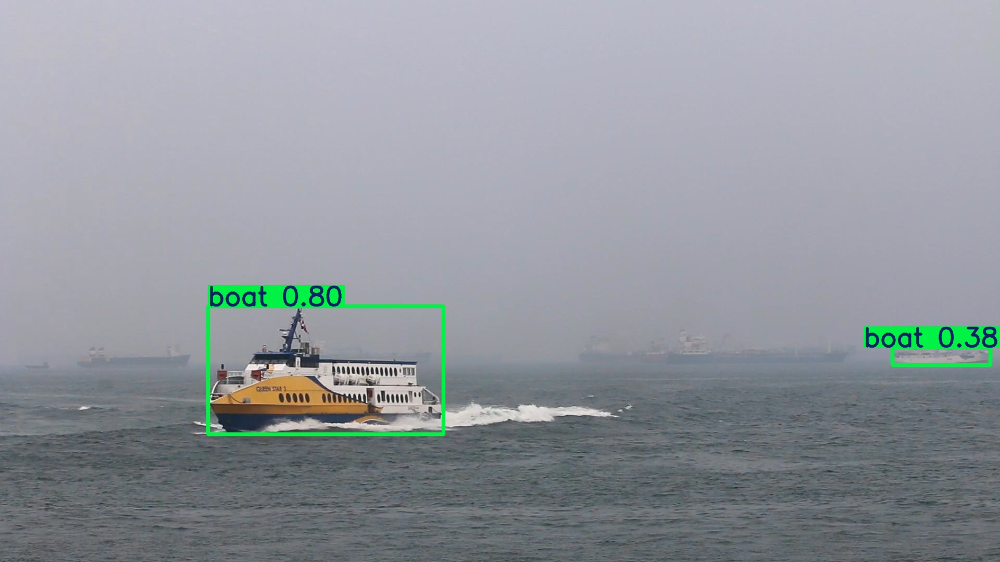

In [ ]:
Image("/content/runs/detect/predict5/MVI_1451_VIS_Haze_0073.jpg", width=500, height=500)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1469_VIS_0592.jpg'

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1469_VIS_0592.jpg: 384x640 6 boats, 143.5ms
Speed: 7.3ms preprocess, 143.5ms inference, 566.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict9
💡 Learn more at https://docs.ultralytics.com/modes/predict


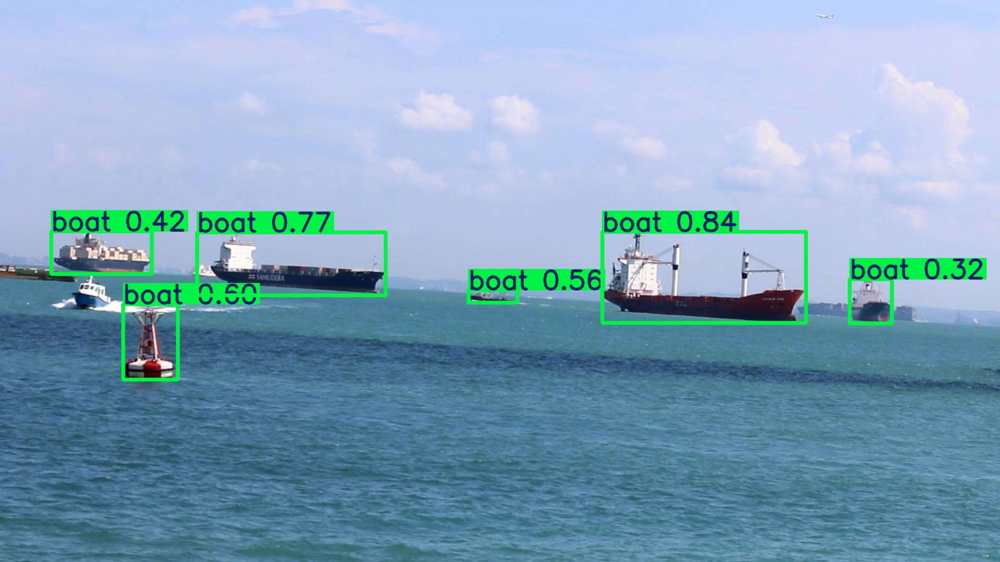

In [ ]:
Image("/content/runs/detect/predict9/MVI_1469_VIS_0592.jpg", width=500, height=500)

In [ ]:
#first predication with yolov8n model without training (original pretrain model)
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_0799_VIS_0117.jpg'

100% 6.25M/6.25M [00:00<00:00, 419MB/s]
Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_0799_VIS_0117.jpg: 384x640 1 boat, 139.9ms
Speed: 15.4ms preprocess, 139.9ms inference, 779.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


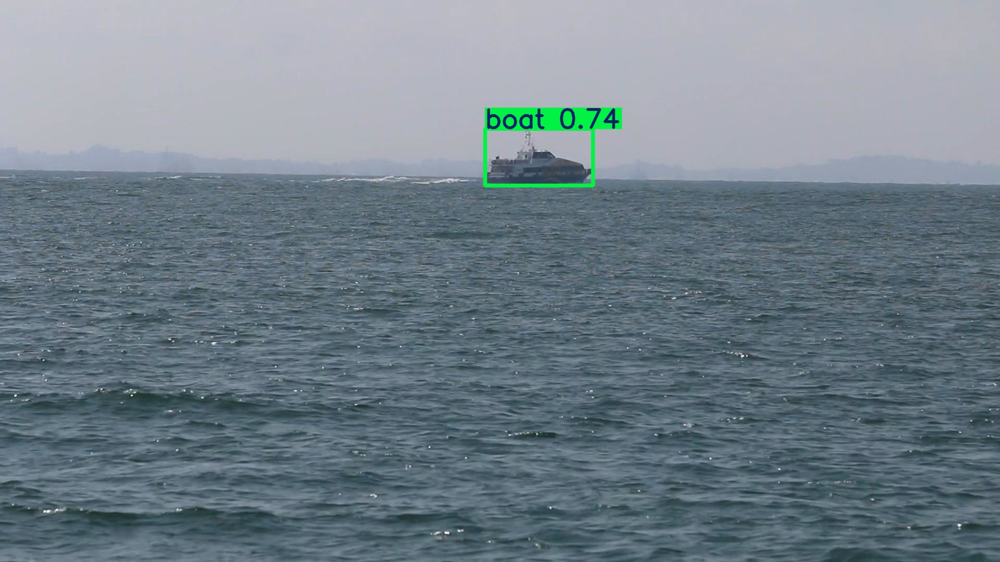

In [ ]:
Image("/content/runs/detect/predict/MVI_0799_VIS_0117.jpg", width=500, height=500)

In [ ]:
#first predication with yolov8n model without training (original pretrain model)
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/0175.jpg'

100% 6.25M/6.25M [00:00<00:00, 358MB/s]
Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/0175.jpg: 448x640 3 boats, 4 kites, 137.2ms
Speed: 14.3ms preprocess, 137.2ms inference, 878.0ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


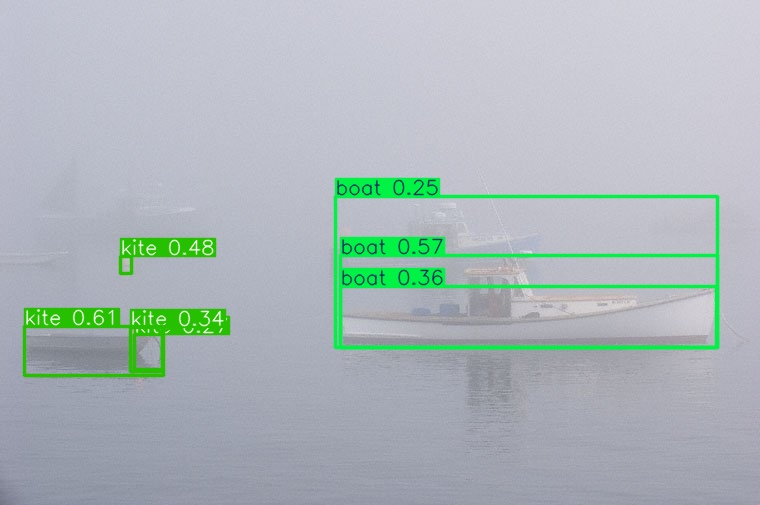

In [ ]:
Image("/content/runs/detect/predict/0175.jpg", width=500, height=500)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing boat.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing boat.jpg: 448x640 1 boat, 137.6ms
Speed: 7.5ms preprocess, 137.6ms inference, 626.9ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


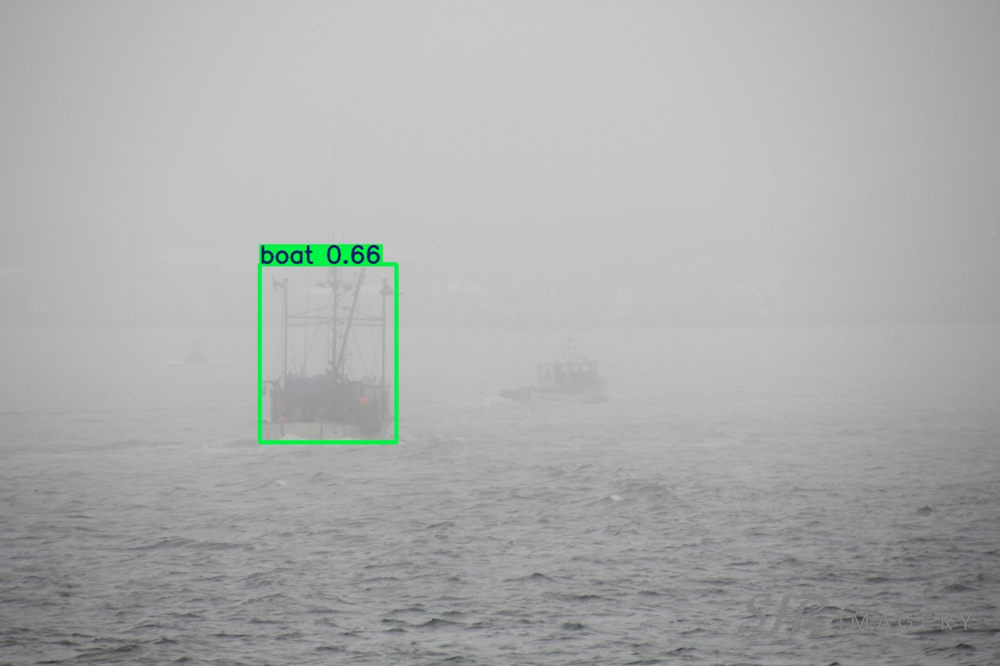

In [ ]:
Image("/content/runs/detect/predict3/fishing boat.jpg", width=500, height=500)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg: 448x640 4 boats, 138.1ms
Speed: 8.0ms preprocess, 138.1ms inference, 626.4ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


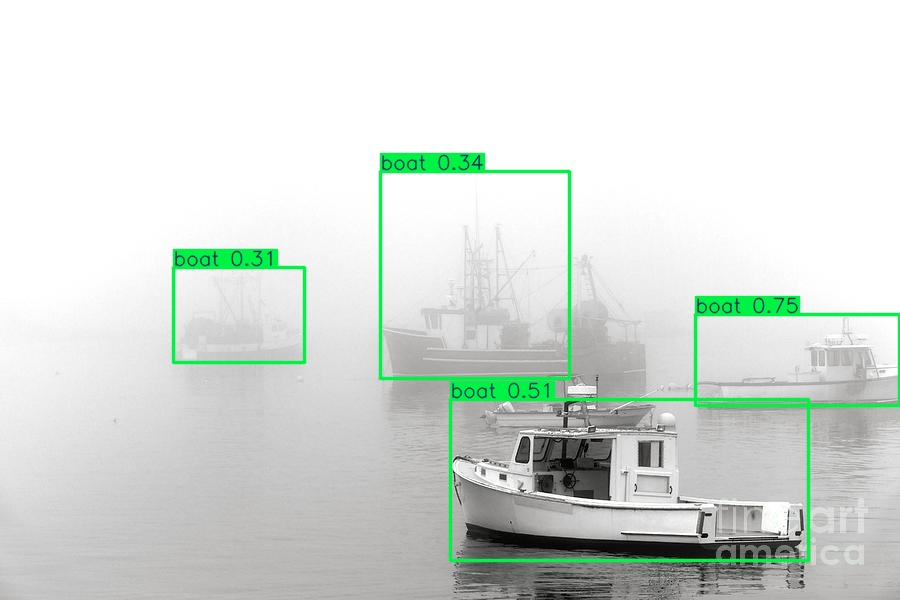

In [ ]:
Image("/content/runs/detect/predict4/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg", width=500, height=500)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg: 448x640 1 boat, 1 kite, 135.6ms
Speed: 6.4ms preprocess, 135.6ms inference, 524.9ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict5
💡 Learn more at https://docs.ultralytics.com/modes/predict


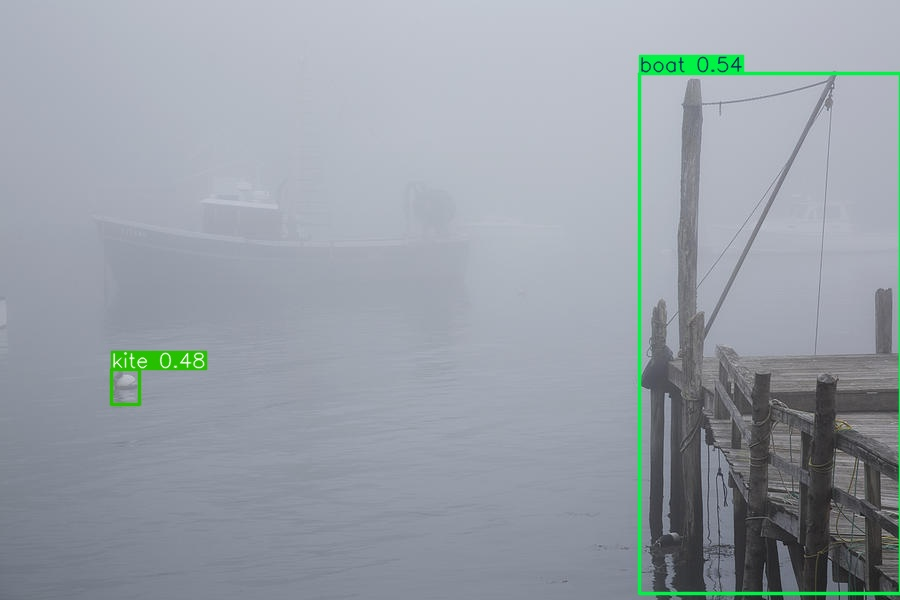

In [ ]:
Image("/content/runs/detect/predict5/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg", width=500, height=500)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-returning.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-returning.jpg: 448x640 1 person, 2 boats, 137.1ms
Speed: 7.0ms preprocess, 137.1ms inference, 616.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


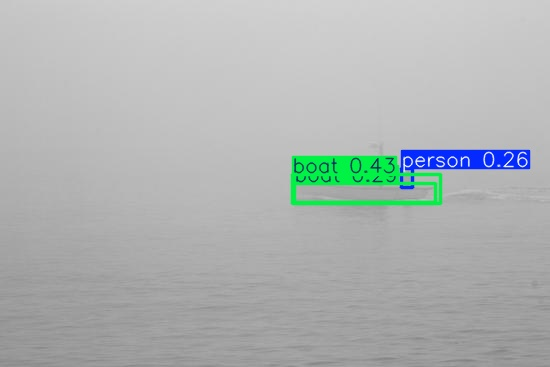

In [ ]:
Image("/content/runs/detect/predict6/lobster-boat-returning.jpg", width=500, height=500)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/maritime-blackboxes-featured-1.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/maritime-blackboxes-featured-1.jpg: 448x640 1 boat, 135.8ms
Speed: 6.8ms preprocess, 135.8ms inference, 577.1ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict23
💡 Learn more at https://docs.ultralytics.com/modes/predict


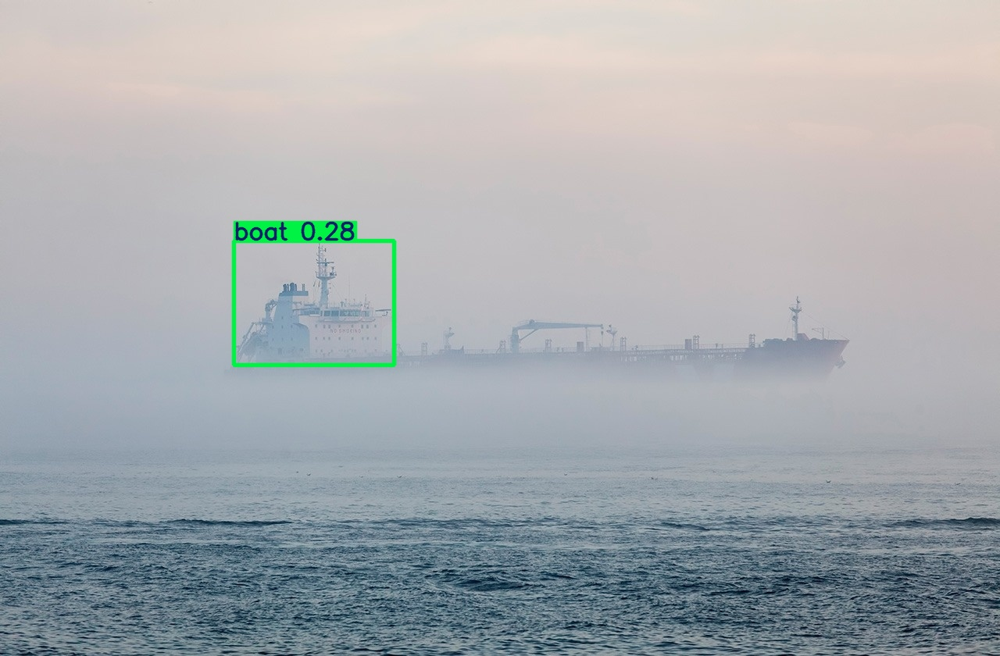

In [ ]:
Image("/content/runs/detect/predict23/maritime-blackboxes-featured-1.jpg", width=500, height=500)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fognavigation_ferries_080919.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fognavigation_ferries_080919.jpg: 448x640 2 boats, 137.1ms
Speed: 7.0ms preprocess, 137.1ms inference, 580.9ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict24
💡 Learn more at https://docs.ultralytics.com/modes/predict


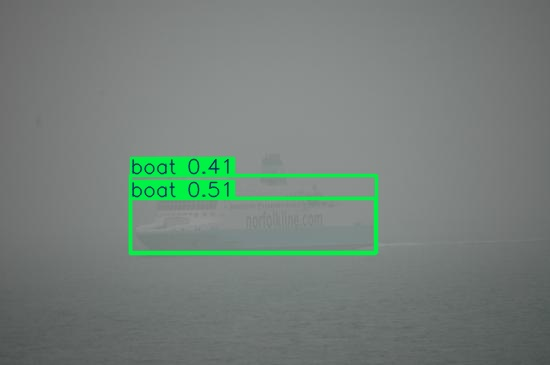

In [ ]:
Image("/content/runs/detect/predict24/fognavigation_ferries_080919.jpg", width=500, height=500)

# **Testing with my 1st model**

In [ ]:
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1451_VIS_Haze_0073.jpg'

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1451_VIS_Haze_0073.jpg: 384x640 1 Buoy, 6 Vessel/ships, 121.6ms
Speed: 6.9ms preprocess, 121.6ms inference, 625.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


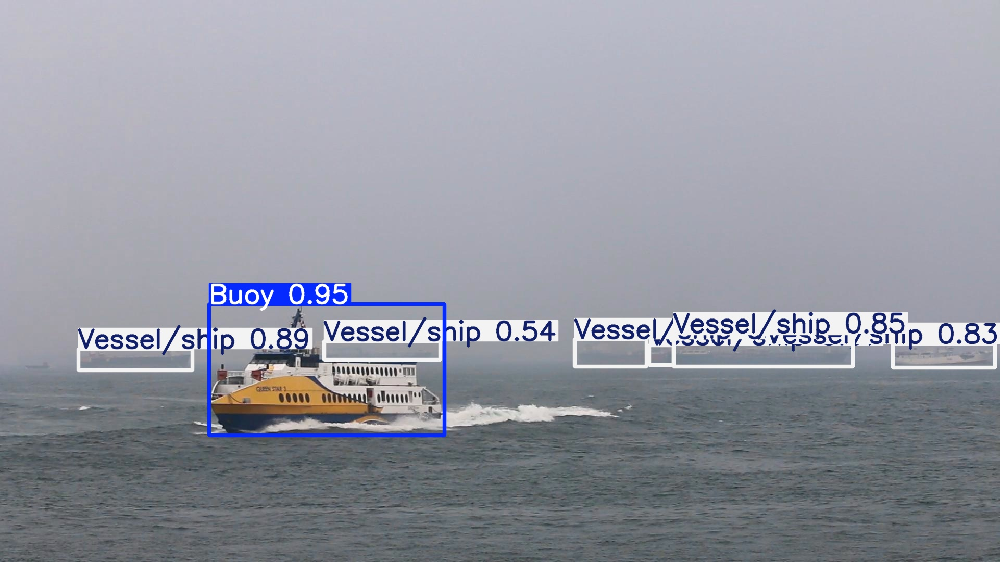

In [ ]:
Image("/content/runs/detect/predict6/MVI_1451_VIS_Haze_0073.jpg", width=500, height=500)

In [ ]:
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1469_VIS_0592.jpg'

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1469_VIS_0592.jpg: 384x640 1 Ferry, 6 Vessel/ships, 2 Sailboat/boats, 122.8ms
Speed: 6.7ms preprocess, 122.8ms inference, 663.8ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict10
💡 Learn more at https://docs.ultralytics.com/modes/predict


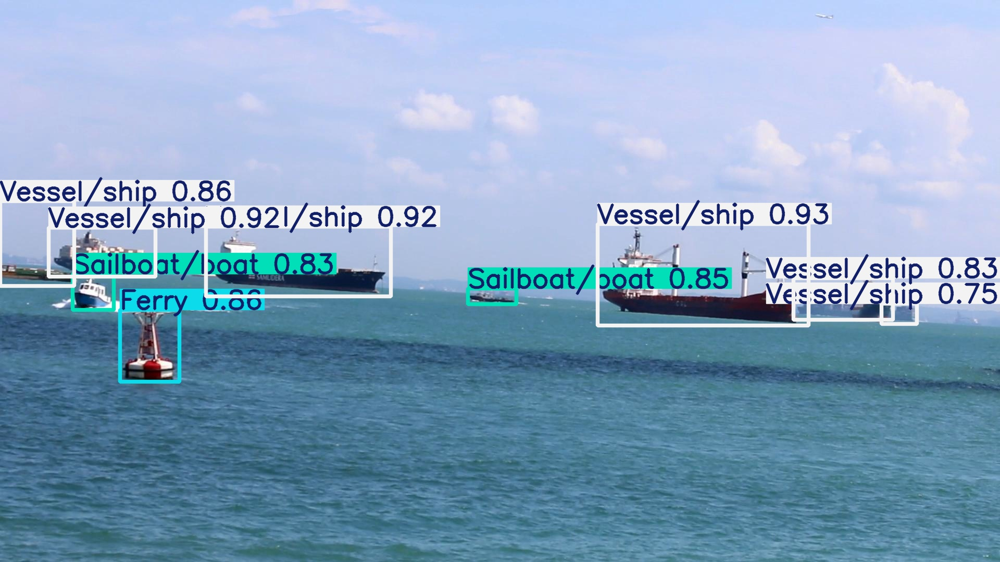

In [ ]:
Image("/content/runs/detect/predict10/MVI_1469_VIS_0592.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_0799_VIS_0117.jpg'

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_0799_VIS_0117.jpg: 384x640 1 Sailboat/boat, 122.6ms
Speed: 7.0ms preprocess, 122.6ms inference, 575.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


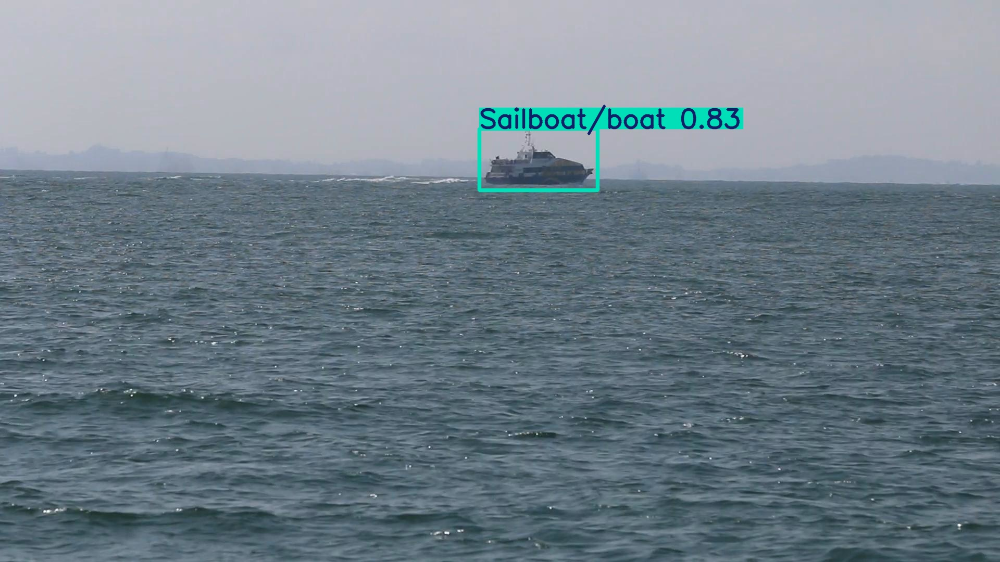

In [ ]:
Image("/content/runs/detect/predict2/MVI_0799_VIS_0117.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/0175.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/0175.jpg: 448x640 1 Vessel/ship, 114.1ms
Speed: 6.2ms preprocess, 114.1ms inference, 623.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


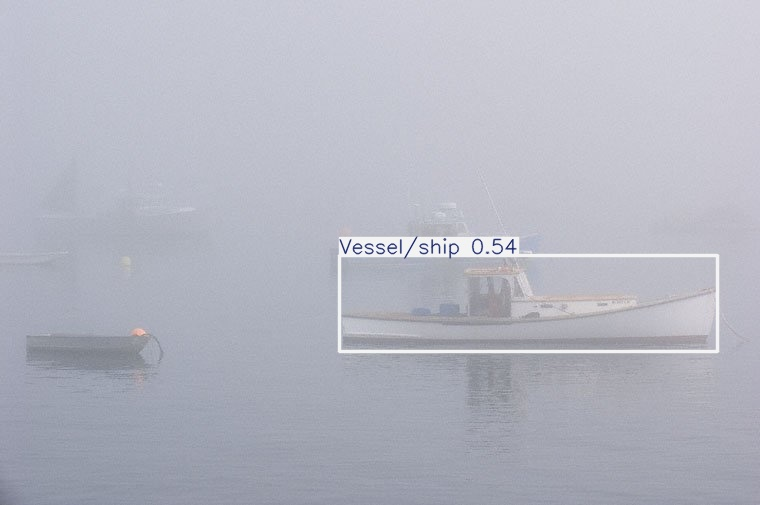

In [ ]:
Image("/content/runs/detect/predict2/0175.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing boat.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing boat.jpg: 448x640 1 Vessel/ship, 115.6ms
Speed: 7.3ms preprocess, 115.6ms inference, 583.2ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict8
💡 Learn more at https://docs.ultralytics.com/modes/predict


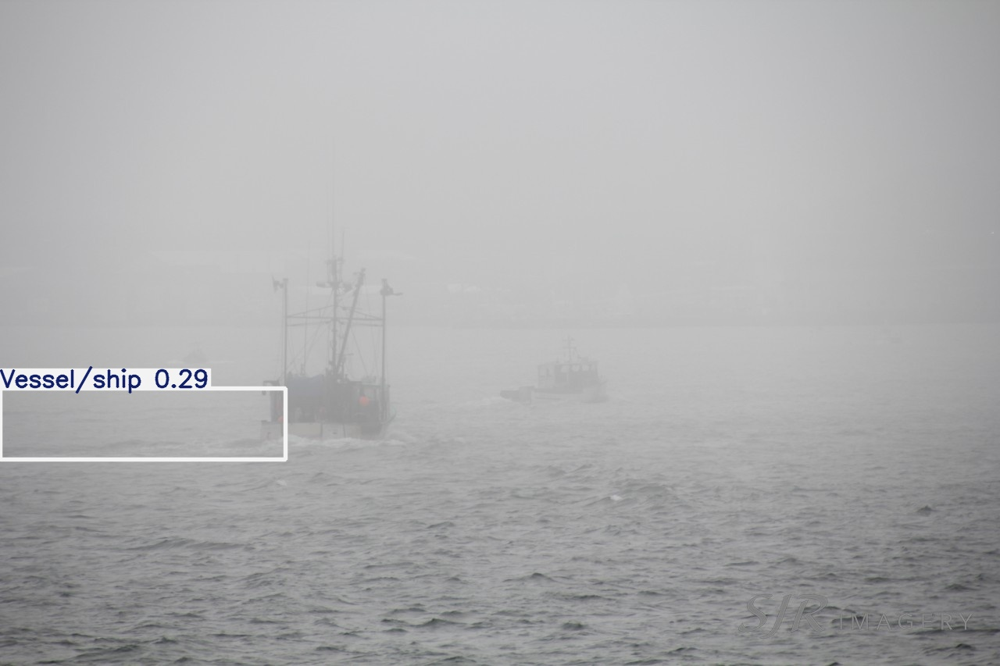

In [ ]:
Image("/content/runs/detect/predict8/fishing boat.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg: 448x640 2 Vessel/ships, 1 Sailboat/boat, 118.2ms
Speed: 6.5ms preprocess, 118.2ms inference, 640.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict9
💡 Learn more at https://docs.ultralytics.com/modes/predict


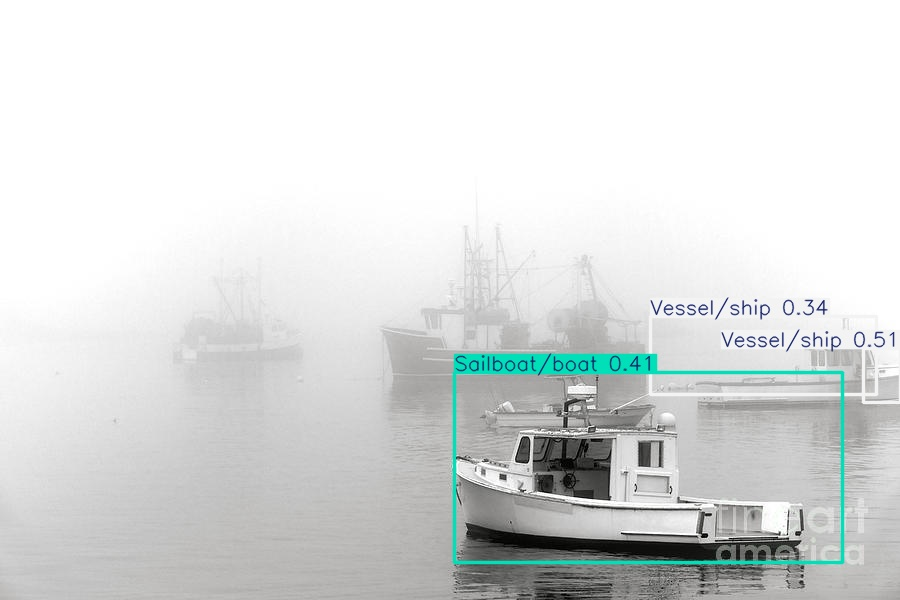

In [ ]:
Image("/content/runs/detect/predict9/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg: 448x640 1 Vessel/ship, 1 Sailboat/boat, 113.2ms
Speed: 6.6ms preprocess, 113.2ms inference, 576.9ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict10
💡 Learn more at https://docs.ultralytics.com/modes/predict


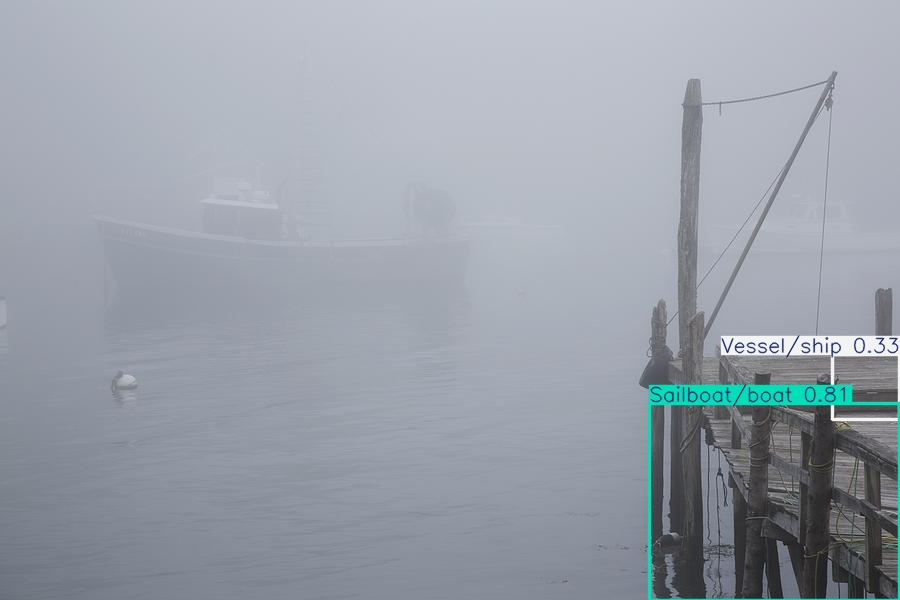

In [ ]:
Image("/content/runs/detect/predict10/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-returning.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-returning.jpg: 448x640 (no detections), 114.9ms
Speed: 8.0ms preprocess, 114.9ms inference, 24.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict11
💡 Learn more at https://docs.ultralytics.com/modes/predict


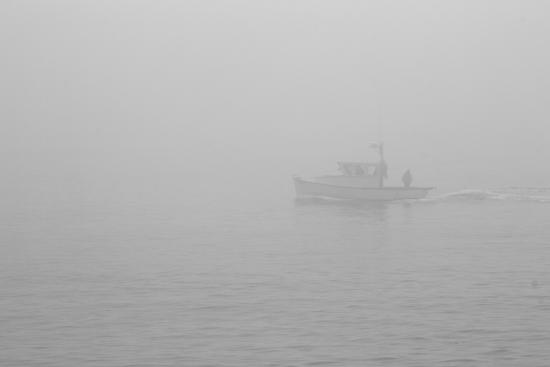

In [ ]:
Image("/content/runs/detect/predict11/lobster-boat-returning.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/maritime-blackboxes-featured-1.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/maritime-blackboxes-featured-1.jpg: 448x640 1 Vessel/ship, 112.5ms
Speed: 6.6ms preprocess, 112.5ms inference, 526.1ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict25
💡 Learn more at https://docs.ultralytics.com/modes/predict


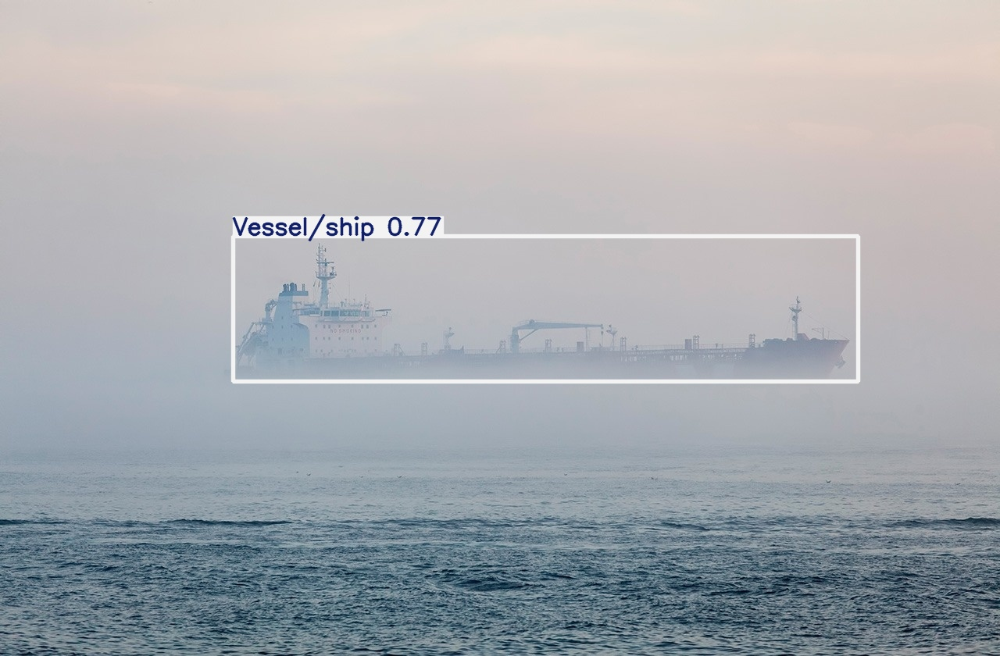

In [ ]:
Image("/content/runs/detect/predict25/maritime-blackboxes-featured-1.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_3/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fognavigation_ferries_080919.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fognavigation_ferries_080919.jpg: 448x640 1 Vessel/ship, 113.1ms
Speed: 7.0ms preprocess, 113.1ms inference, 624.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict26
💡 Learn more at https://docs.ultralytics.com/modes/predict


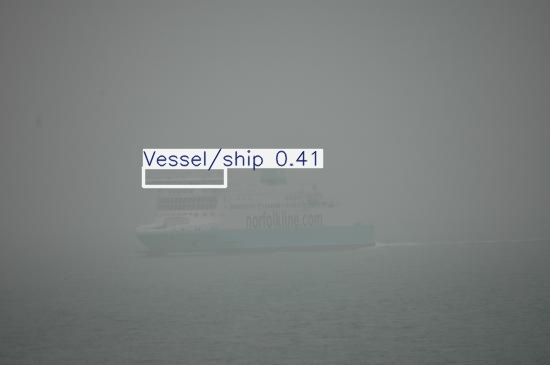

In [ ]:
Image("/content/runs/detect/predict26/fognavigation_ferries_080919.jpg", width=500, height=500)

# **Testing with my 2nd Model**

In [ ]:
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1451_VIS_Haze_0073.jpg'

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1451_VIS_Haze_0073.jpg: 384x640 1 Buoy, 6 Vessel/ships, 146.7ms
Speed: 6.2ms preprocess, 146.7ms inference, 640.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict7
💡 Learn more at https://docs.ultralytics.com/modes/predict


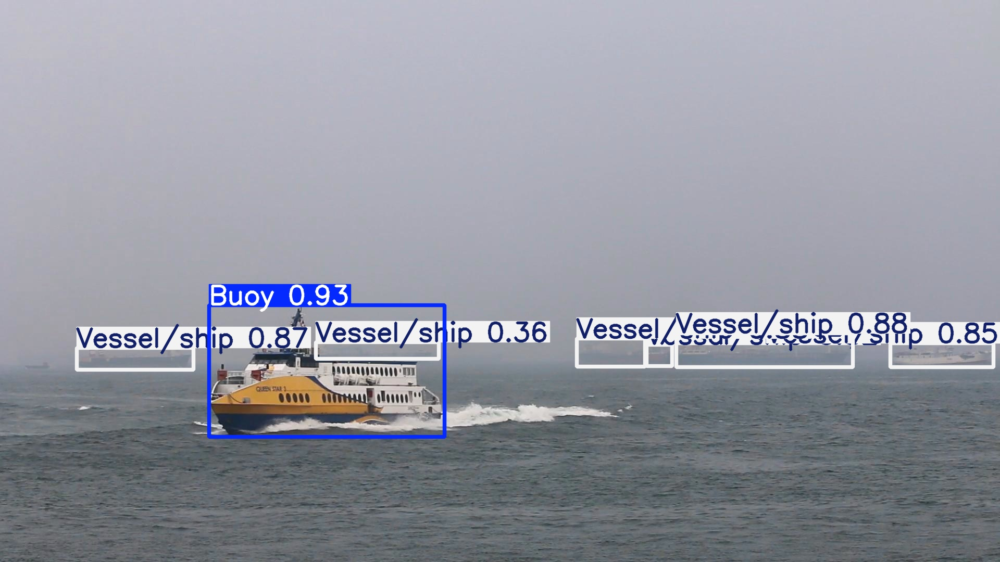

In [ ]:
Image("/content/runs/detect/predict7/MVI_1451_VIS_Haze_0073.jpg", width=500, height=500)

In [ ]:
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1469_VIS_0592.jpg'

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1469_VIS_0592.jpg: 384x640 1 Ferry, 8 Vessel/ships, 2 Sailboat/boats, 160.0ms
Speed: 6.7ms preprocess, 160.0ms inference, 547.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict11
💡 Learn more at https://docs.ultralytics.com/modes/predict


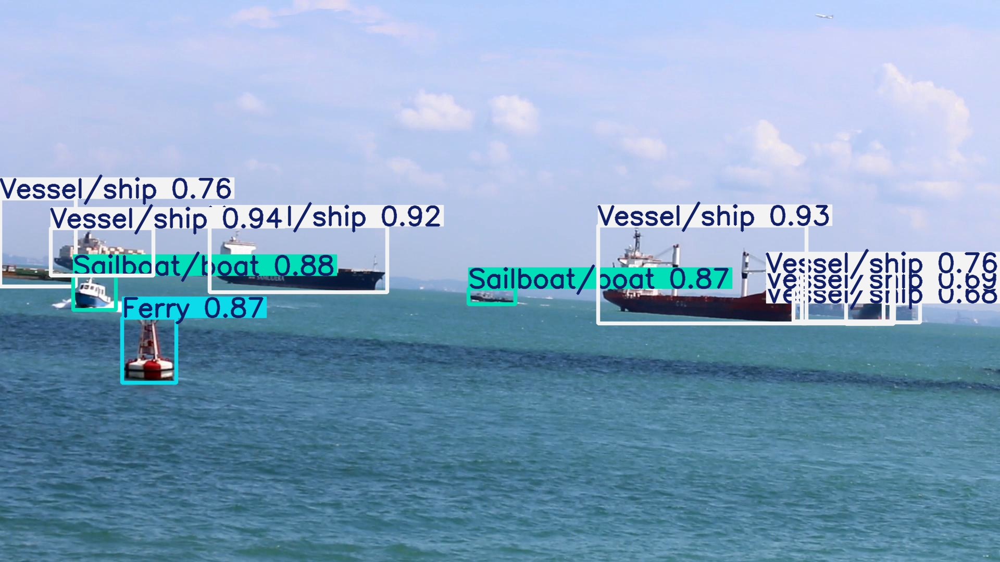

In [ ]:
Image("/content/runs/detect/predict11/MVI_1469_VIS_0592.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_0799_VIS_0117.jpg'

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_0799_VIS_0117.jpg: 384x640 1 Vessel/ship, 145.2ms
Speed: 6.2ms preprocess, 145.2ms inference, 546.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


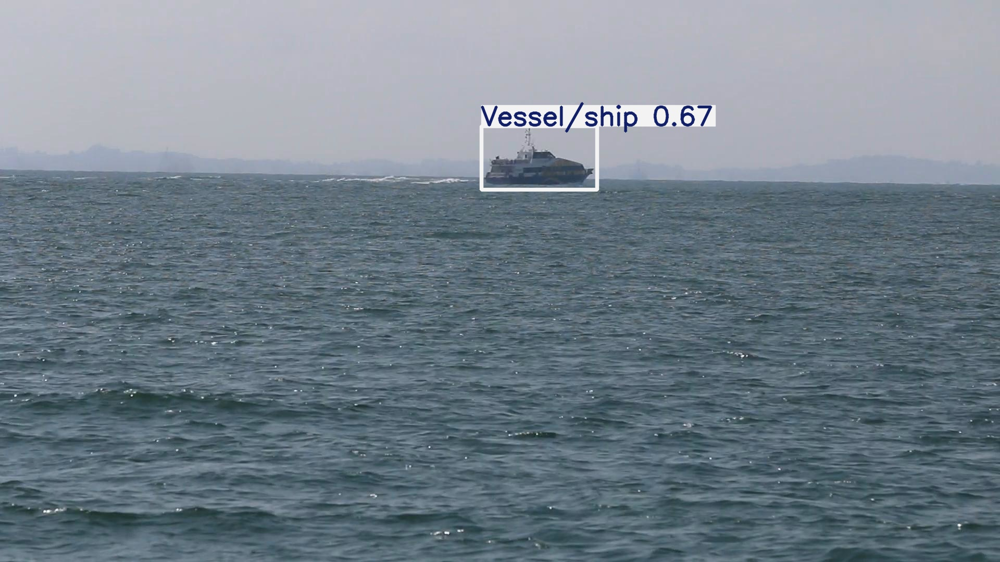

In [ ]:
Image("/content/runs/detect/predict3/MVI_0799_VIS_0117.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/0175.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/0175.jpg: 448x640 1 Vessel/ship, 138.2ms
Speed: 6.5ms preprocess, 138.2ms inference, 701.8ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict12
💡 Learn more at https://docs.ultralytics.com/modes/predict


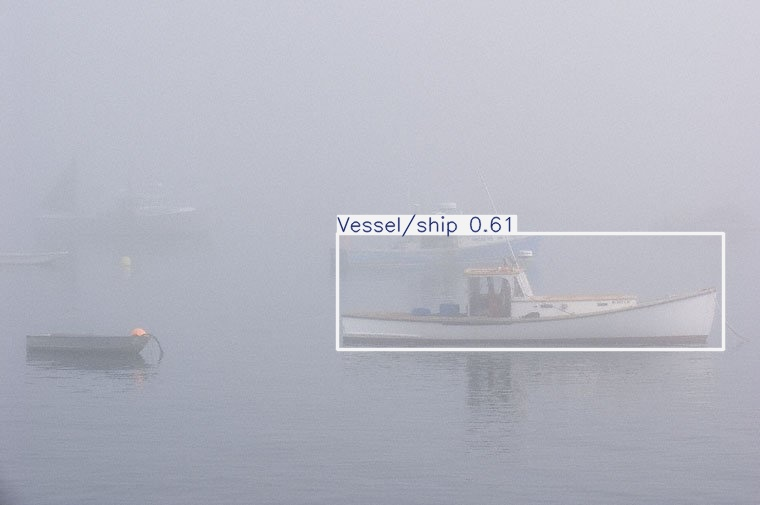

In [ ]:
Image("/content/runs/detect/predict12/0175.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing boat.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing boat.jpg: 448x640 (no detections), 139.2ms
Speed: 6.3ms preprocess, 139.2ms inference, 25.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict13
💡 Learn more at https://docs.ultralytics.com/modes/predict


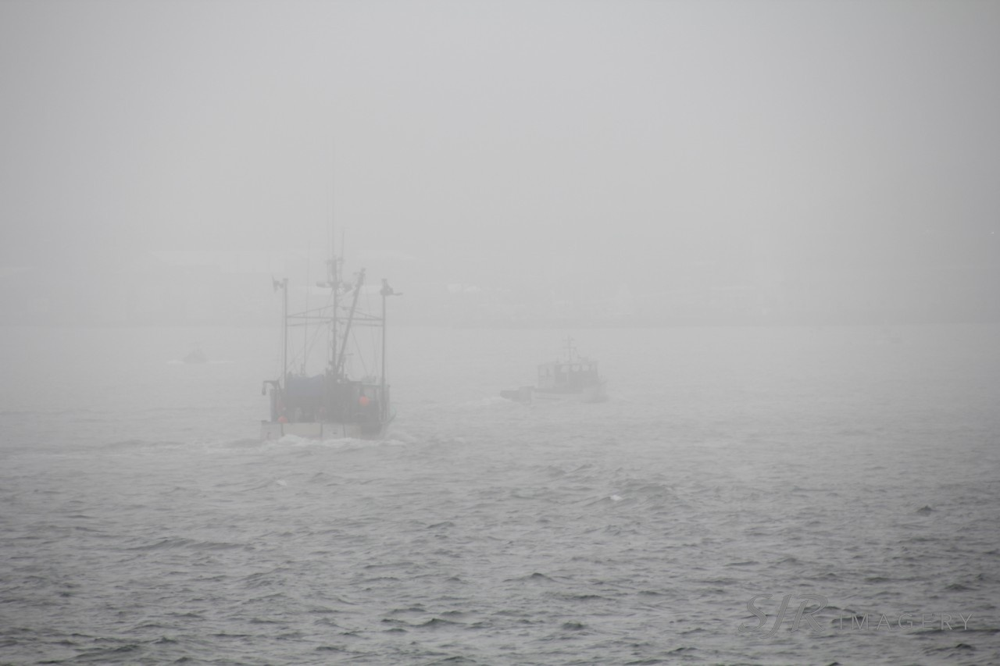

In [ ]:
Image("/content/runs/detect/predict13/fishing boat.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg: 448x640 (no detections), 137.1ms
Speed: 6.3ms preprocess, 137.1ms inference, 21.9ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict15
💡 Learn more at https://docs.ultralytics.com/modes/predict


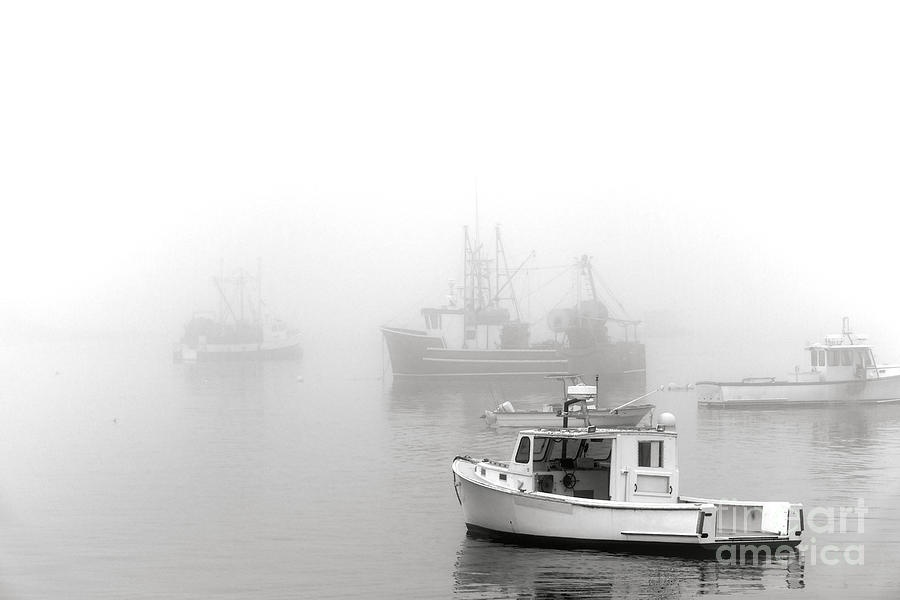

In [ ]:
Image("/content/runs/detect/predict15/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg: 448x640 (no detections), 137.9ms
Speed: 6.8ms preprocess, 137.9ms inference, 20.9ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict16
💡 Learn more at https://docs.ultralytics.com/modes/predict


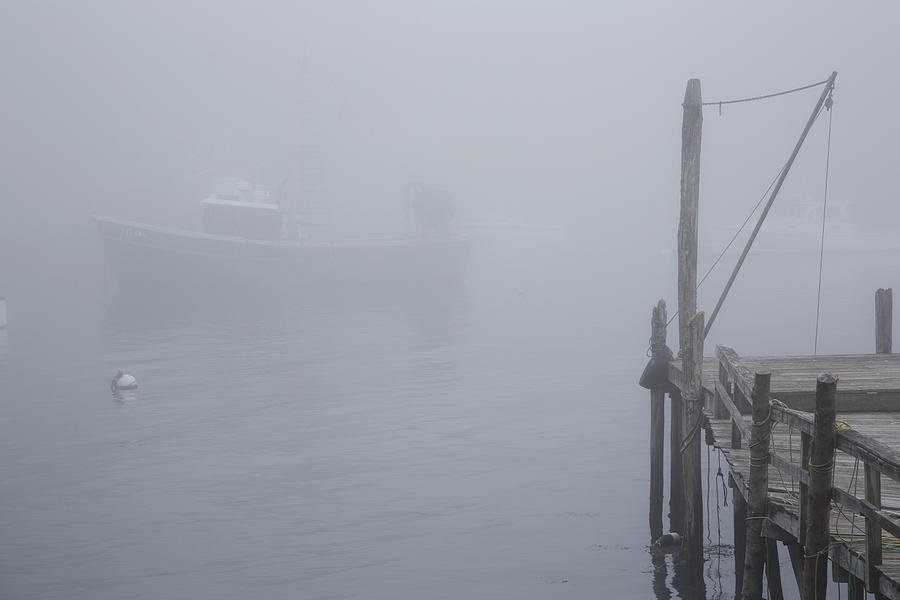

In [ ]:
Image("/content/runs/detect/predict16/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-returning.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-returning.jpg: 448x640 (no detections), 141.0ms
Speed: 7.2ms preprocess, 141.0ms inference, 21.7ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict17
💡 Learn more at https://docs.ultralytics.com/modes/predict


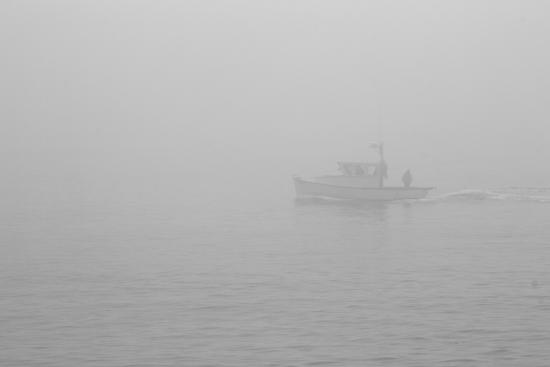

In [ ]:
Image("/content/runs/detect/predict17/lobster-boat-returning.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/maritime-blackboxes-featured-1.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/maritime-blackboxes-featured-1.jpg: 448x640 1 Vessel/ship, 143.7ms
Speed: 5.8ms preprocess, 143.7ms inference, 770.4ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict27
💡 Learn more at https://docs.ultralytics.com/modes/predict


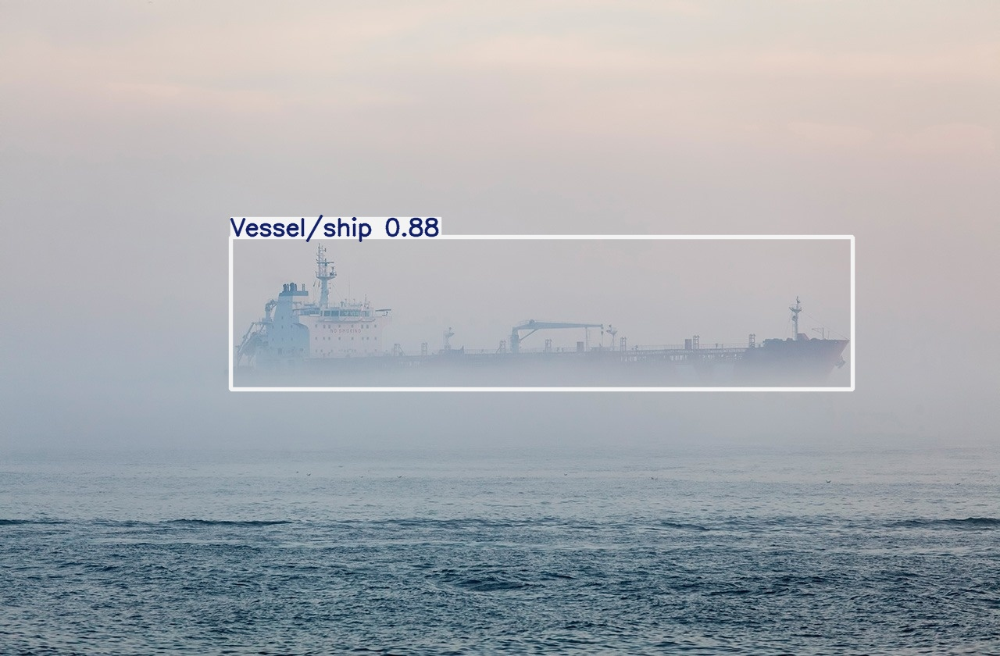

In [ ]:
Image("/content/runs/detect/predict27/maritime-blackboxes-featured-1.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_4/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fognavigation_ferries_080919.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fognavigation_ferries_080919.jpg: 448x640 1 Vessel/ship, 139.6ms
Speed: 7.1ms preprocess, 139.6ms inference, 541.2ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict28
💡 Learn more at https://docs.ultralytics.com/modes/predict


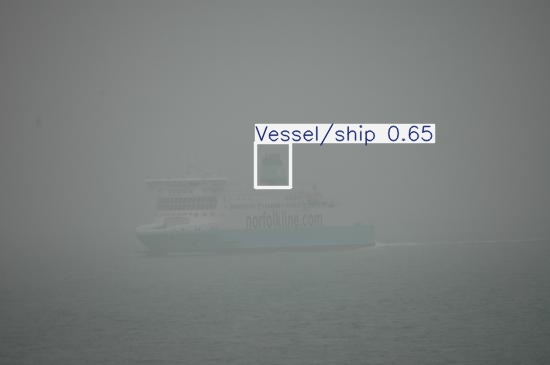

In [ ]:
Image("/content/runs/detect/predict28/fognavigation_ferries_080919.jpg", width=500, height=500)

# **Testing with my 3rd Model**

In [ ]:
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1451_VIS_Haze_0073.jpg'

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1451_VIS_Haze_0073.jpg: 384x640 1 Buoy, 6 Vessel/ships, 144.9ms
Speed: 6.2ms preprocess, 144.9ms inference, 563.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict8
💡 Learn more at https://docs.ultralytics.com/modes/predict


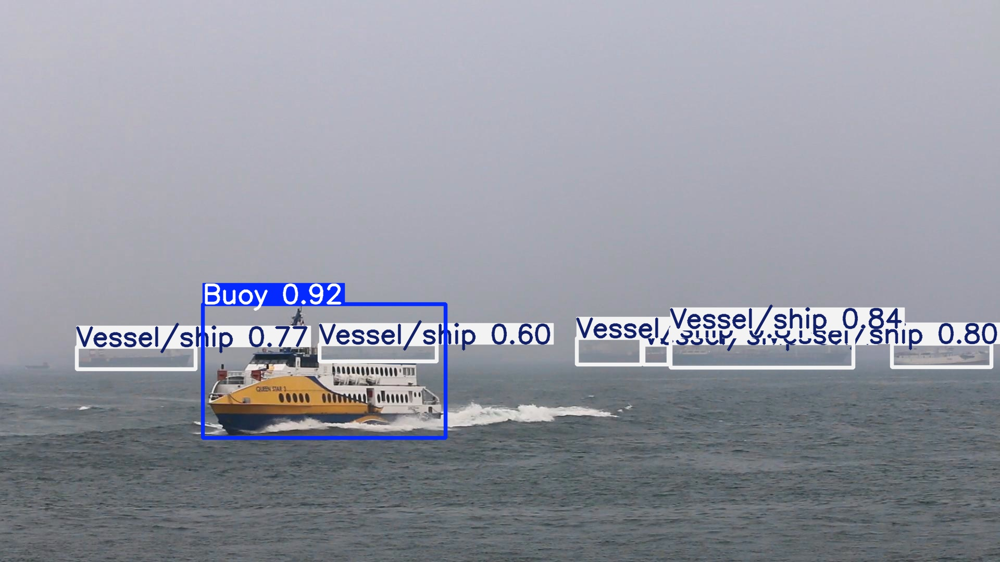

In [ ]:
Image("/content/runs/detect/predict8/MVI_1451_VIS_Haze_0073.jpg", width=500, height=500)

In [ ]:
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1469_VIS_0592.jpg'

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_1469_VIS_0592.jpg: 384x640 1 Ferry, 7 Vessel/ships, 2 Sailboat/boats, 146.2ms
Speed: 6.3ms preprocess, 146.2ms inference, 614.8ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict12
💡 Learn more at https://docs.ultralytics.com/modes/predict


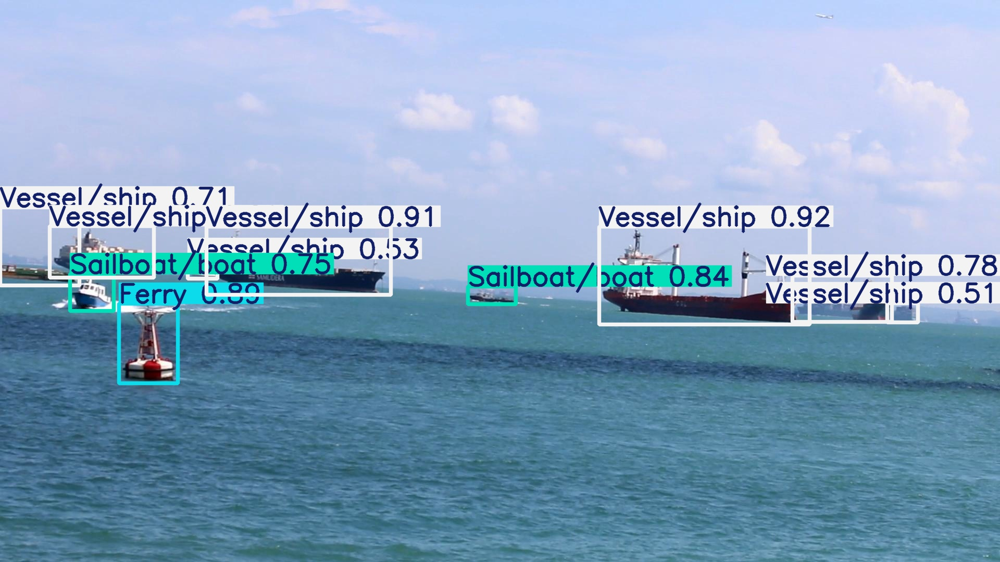

In [ ]:
Image("/content/runs/detect/predict12/MVI_1469_VIS_0592.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_0799_VIS_0117.jpg'

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/MVI_0799_VIS_0117.jpg: 384x640 1 Vessel/ship, 143.0ms
Speed: 6.4ms preprocess, 143.0ms inference, 721.1ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


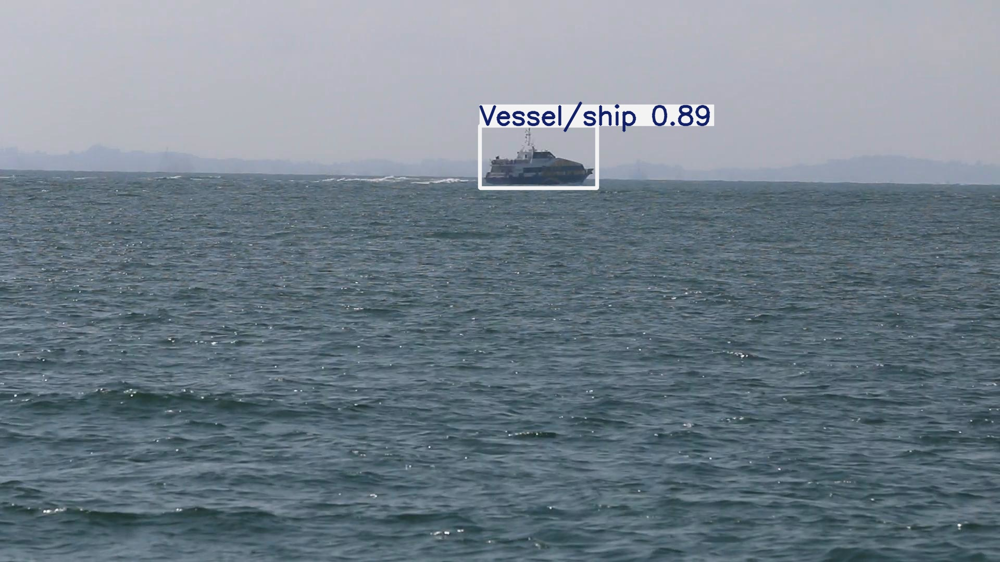

In [ ]:
Image("/content/runs/detect/predict4/MVI_0799_VIS_0117.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/0175.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/0175.jpg: 448x640 1 Buoy, 2 Vessel/ships, 139.5ms
Speed: 6.2ms preprocess, 139.5ms inference, 618.2ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict18
💡 Learn more at https://docs.ultralytics.com/modes/predict


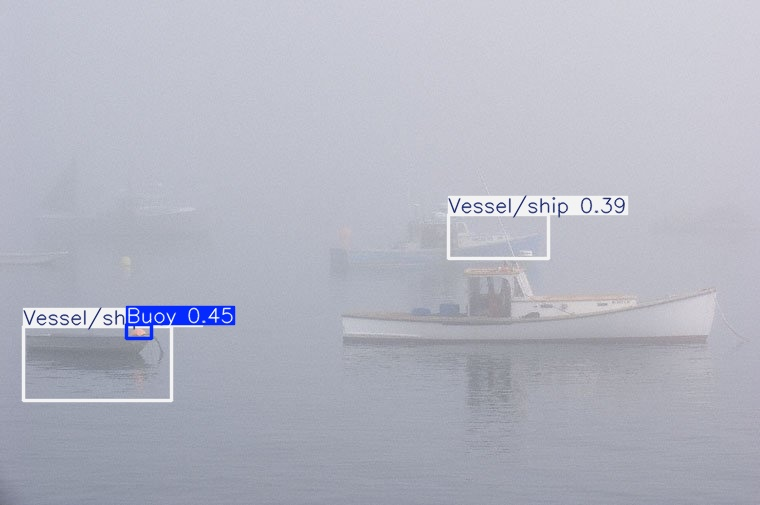

In [ ]:
Image("/content/runs/detect/predict18/0175.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing boat.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing boat.jpg: 448x640 (no detections), 139.0ms
Speed: 6.1ms preprocess, 139.0ms inference, 30.8ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict19
💡 Learn more at https://docs.ultralytics.com/modes/predict


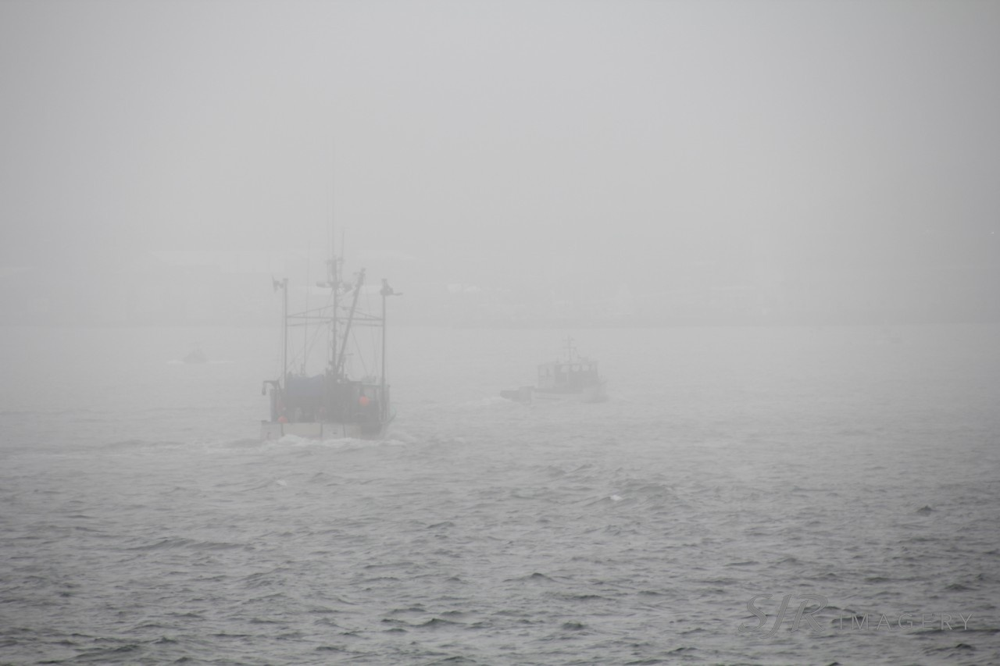

In [ ]:
Image("/content/runs/detect/predict19/fishing boat.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg: 448x640 4 Vessel/ships, 1 Sailboat/boat, 137.7ms
Speed: 6.4ms preprocess, 137.7ms inference, 565.4ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict20
💡 Learn more at https://docs.ultralytics.com/modes/predict


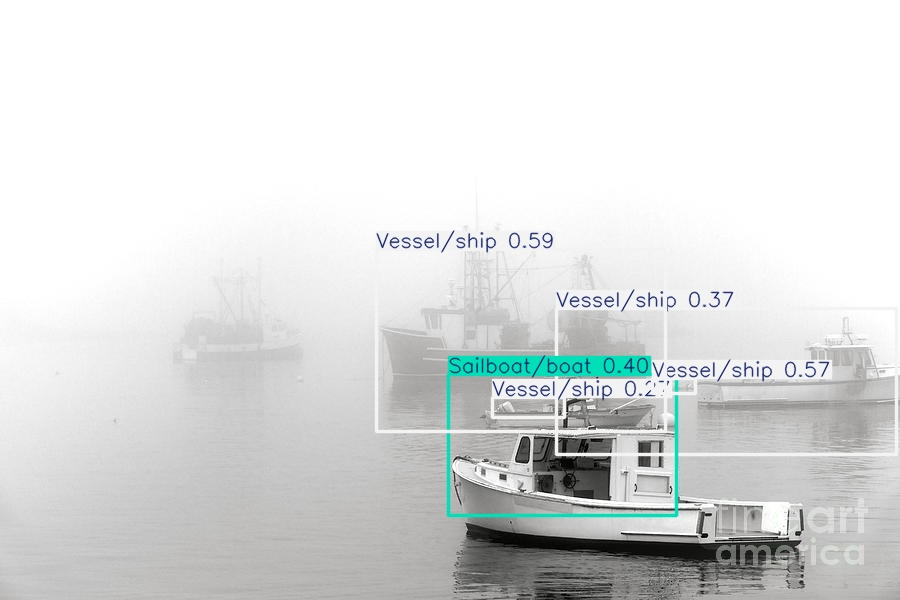

In [ ]:
Image("/content/runs/detect/predict20/fishing-boat-in-thick-maine-coast-fog-olivier-le-queinec.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg: 448x640 (no detections), 138.3ms
Speed: 6.3ms preprocess, 138.3ms inference, 22.1ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict21
💡 Learn more at https://docs.ultralytics.com/modes/predict


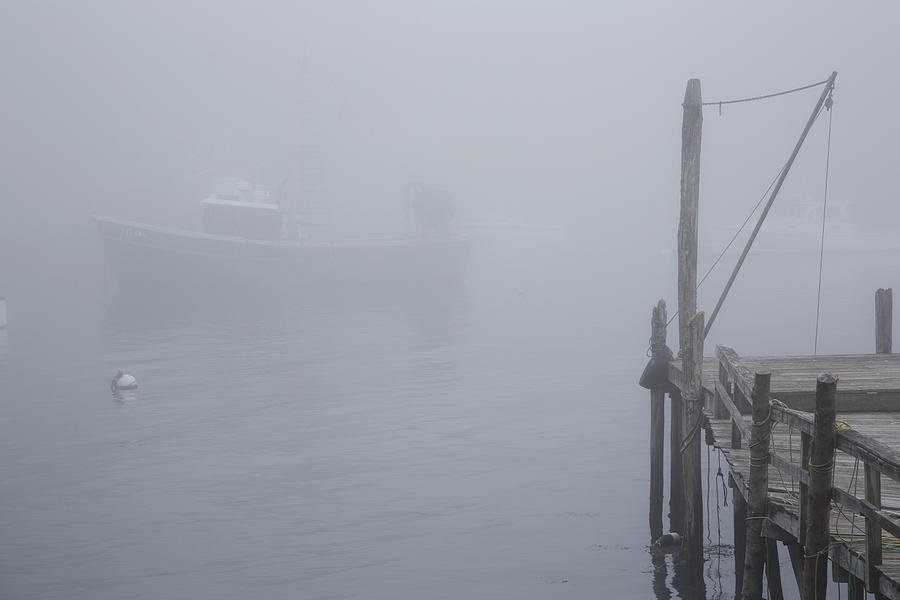

In [ ]:
Image("/content/runs/detect/predict21/lobster-boat-and-boat-dock-in-fog-new-lynn-stone.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-returning.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/lobster-boat-returning.jpg: 448x640 1 Vessel/ship, 143.0ms
Speed: 7.9ms preprocess, 143.0ms inference, 590.8ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict22
💡 Learn more at https://docs.ultralytics.com/modes/predict


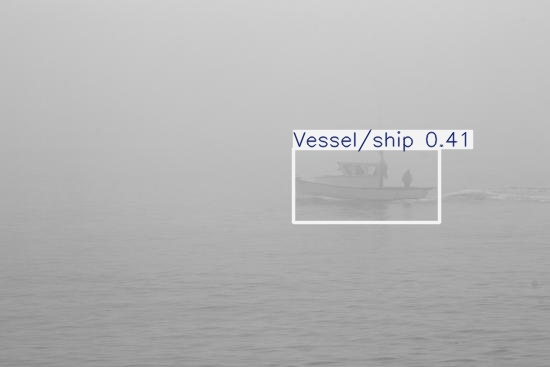

In [ ]:
Image("/content/runs/detect/predict22/lobster-boat-returning.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/maritime-blackboxes-featured-1.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/maritime-blackboxes-featured-1.jpg: 448x640 2 Vessel/ships, 138.6ms
Speed: 5.8ms preprocess, 138.6ms inference, 527.2ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict29
💡 Learn more at https://docs.ultralytics.com/modes/predict


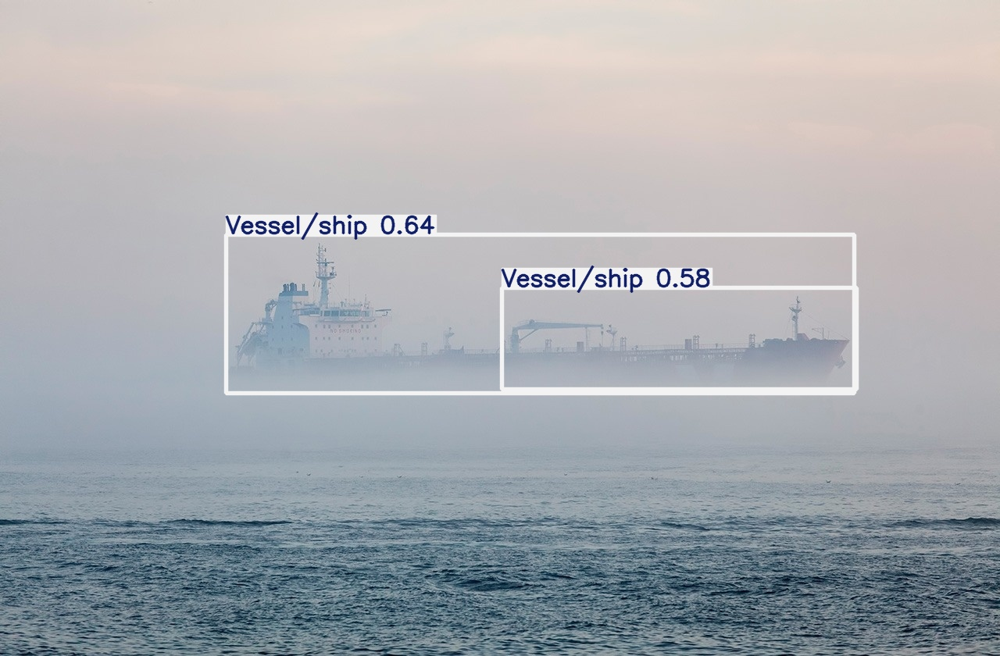

In [ ]:
Image("/content/runs/detect/predict29/maritime-blackboxes-featured-1.jpg", width=500, height=500)

In [ ]:
#testing with my trained yolov8 models(different weights)
!yolo task=detect mode=predict model='/content/drive/MyDrive/Master Project/smd_plus/SMD_YOLO_dataset_v12/yolov8_training_results/run_2/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/Master Project/smd_plus/Testing images/fognavigation_ferries_080919.jpg'

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/Master Project/smd_plus/Testing images/fognavigation_ferries_080919.jpg: 448x640 1 Vessel/ship, 136.8ms
Speed: 7.1ms preprocess, 136.8ms inference, 744.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict30
💡 Learn more at https://docs.ultralytics.com/modes/predict


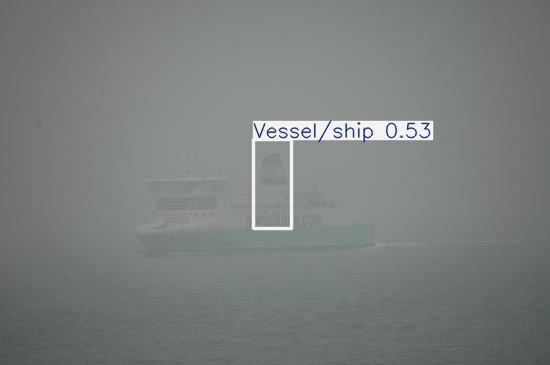

In [ ]:
Image("/content/runs/detect/predict30/fognavigation_ferries_080919.jpg", width=500, height=500)